In [2]:
import h5py
import numpy as np 
from ripser import Rips, ripser
from sklearn import preprocessing
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.ndimage import gaussian_filter1d, gaussian_filter
from scipy.sparse import coo_matrix
from scipy.linalg import eigh
from scipy.sparse.linalg import lsmr
from datetime import datetime 
import time
import sys
import numba
import matplotlib
import matplotlib.pyplot as plt
#from utils import *
from sklearn.neighbors import NearestNeighbors
from mpl_toolkits.mplot3d import Axes3D

In [3]:
from umaph import * 

## Noisy sphere 

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:25: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



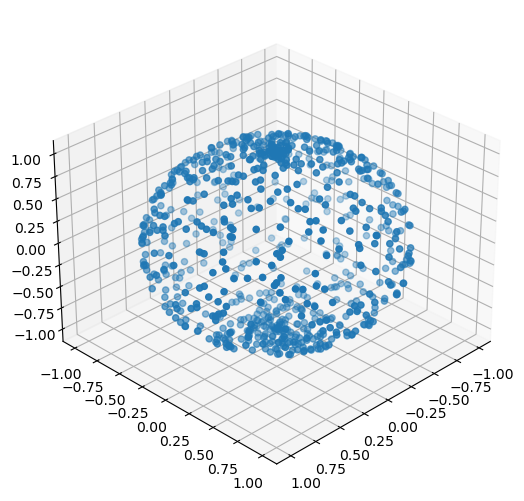

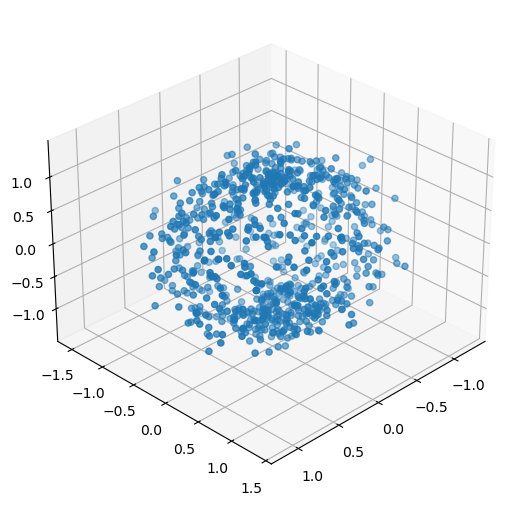

In [46]:
num_points = 1000
points = np.linspace(0,2*np.pi,num_points+1)[:-1]
pointsX, pointsY = np.meshgrid(points, points)

pointsX = np.random.laplace(pointsX.flatten(), scale=0.2)

pointsY = pointsY.flatten()
pointsY = np.random.laplace(pointsY.flatten(), scale=0.2)
num_points = 800

np.random.shuffle(pointsX)
pointsX = pointsX[:num_points]
np.random.shuffle(pointsY)
pointsY = pointsY[:num_points]

circ_points = np.concatenate(((np.sin(pointsY)*np.cos(pointsX))[:,np.newaxis],
                              (np.sin(pointsY)*np.sin(pointsX))[:,np.newaxis],
                              np.cos(pointsY)[:,np.newaxis]), 1)
rand_points = np.random.laplace(circ_points, scale=0.1)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(circ_points[:,0],circ_points[:,1],circ_points[:,2])
ax.view_init(30,45)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(rand_points[:,0],rand_points[:,1],rand_points[:,2])
ax.view_init(30,45)
data = rand_points.copy()


In [47]:

umaph_model =  UMAPH(
            pca_dim=0,  # Number of principal components kept
            n_points=400,  # Number of points to fuzzy downsample to
            k=500,  # Number of neighbours for "fuzzy downsampling"
            metric='euclidean',  # Choose initial choice of metric
            maxdim=1,  # Number of homology dimensions
            coeff=47,
            # Homology coefficients, random prime number chosen, relevant if one suspects "torsion" group in homology
            active_times=0,
            # Number of points with high mean population activity kept after downsampling
            nbs=200,
            # Number of neighbours in final fuzzy metric computation for homology computation
            smoothing=0,  # sigma of gaussian filter
            bSqrt = False,
            num_times=1,
            # temporal downsampling, keep every "num_times"-th point
            dec_tresh=0.99,
            # ratio of cocycle life  determining the "size"/scale of Vietoris-rips complex higher percentage = more edges/simplices
            ph_classes=[0, 1],
            # compute circular coordinates for top ph_classes cocycles
            compute_h2=True,  # if True, compute H2s with Giotto
            n_points_h2=None,  # 1024 take 114s with Giotto
            decoding_analysis=True,
            verbose=True,
    )

data shape (3, 800)
after Preprocessing data shape (800, 3)
Preprocessing took 0.0029981136322021484
after Fuzzy Downsampling data shape (400, 3)
Fuzzy Downsampling took 0.231001615524292
distance_matrix (400, 400)
UMA took 0.06299614906311035
PH lifetime thresh 13.77673079432324


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:520: RuntimeWarning:

divide by zero encountered in log



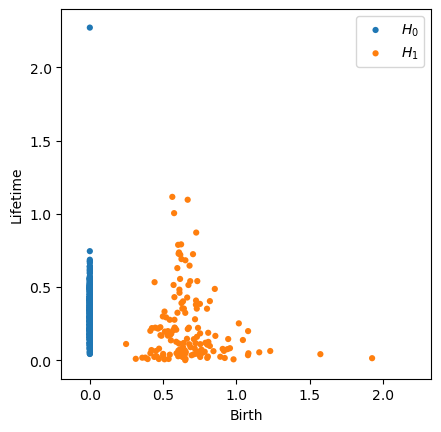

PH took 0.20000362396240234
Computing H2 with None points (takes approx 2min.)


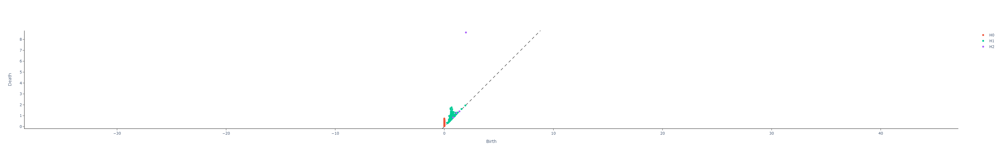

Giotto took 4.403085947036743


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:585: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) 

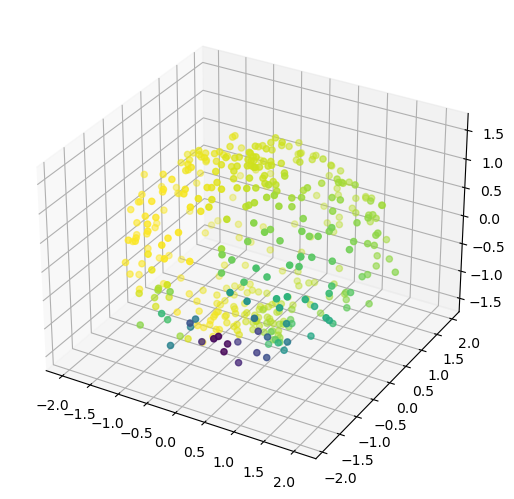

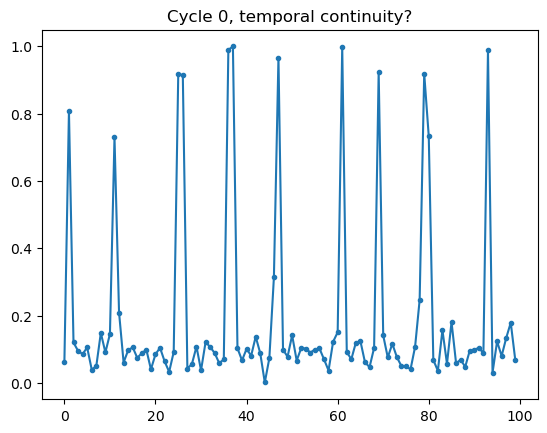

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:585: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) 

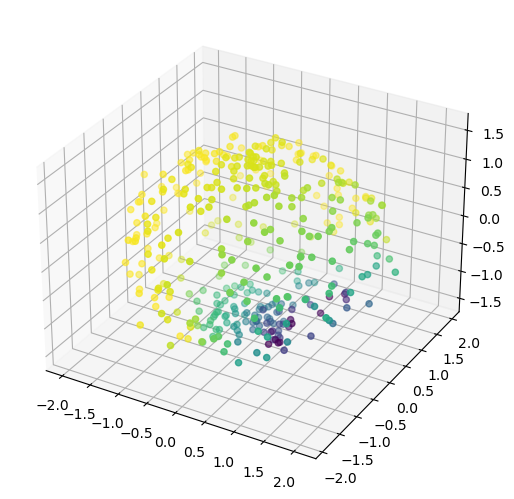

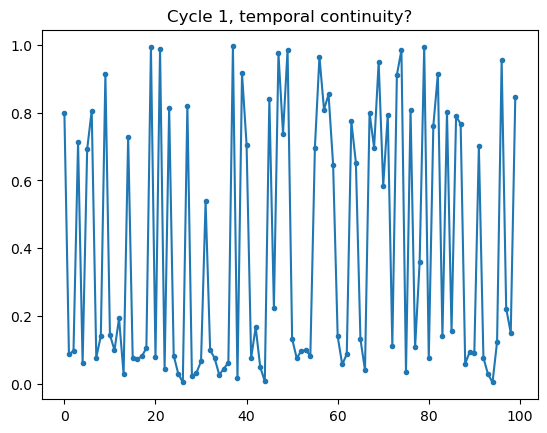

Decoding took 1.2879714965820312


In [48]:
umaph_model.fit_transform(data.T)

## Two Circles

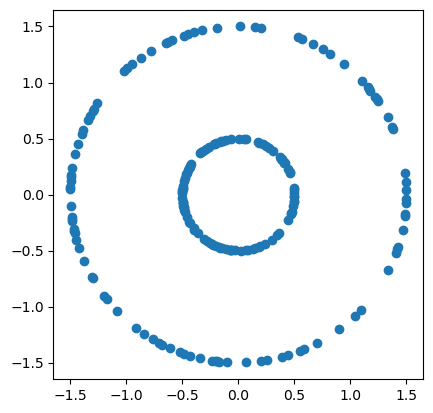

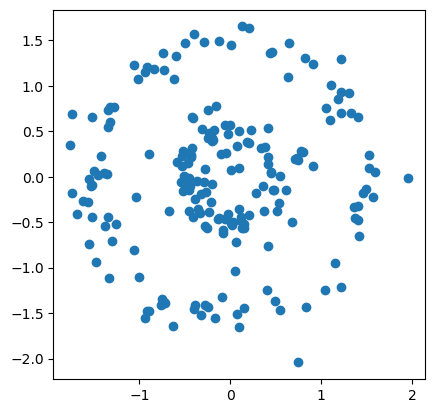

In [62]:
num_points = 100
points = np.linspace(0,2*np.pi,num_points*5)
np.random.shuffle(points)
points = points[:num_points]
#points = np.random.ranf(num_points)*2*np.pi
r1,r2 = 1.5,0.5
scale = 0.1
circ_points = np.concatenate((r1*np.cos(points)[:,np.newaxis],r1*np.sin(points)[:,np.newaxis]), 1)
rand_points = np.random.laplace(circ_points, scale=scale)


circ_points1 = np.concatenate((r2*np.cos(points)[:,np.newaxis],r2*np.sin(points)[:,np.newaxis]), 1)
#circ_points1 = np.concatenate((np.cos(points)[:,np.newaxis],np.sin(points)[:,np.newaxis]), 1)+1.5
rand_points1 = np.random.laplace(circ_points1, scale=scale)
circ_points = np.concatenate((circ_points, circ_points1))
rand_points = np.concatenate((rand_points, rand_points1))
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(circ_points[:,0],circ_points[:,1])
ax.set_aspect('equal', 'box')
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
data = rand_points.copy()

In [113]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=100,
            k=100,  
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            nbs=50,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0, 1],
            compute_h2=False,
            n_points_h2=None, 
            decoding_analysis=True,
            extrapolate_closest = True )

data shape (2, 200)
after Preprocessing data shape (200, 2)
Preprocessing took 0.0009703636169433594
after Fuzzy Downsampling data shape (100, 2)
Fuzzy Downsampling took 2.1166601181030273
distance_matrix (100, 100)
UMA took 0.007024049758911133
PH lifetime thresh 6.592948212675624


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:555: RuntimeWarning:

divide by zero encountered in log



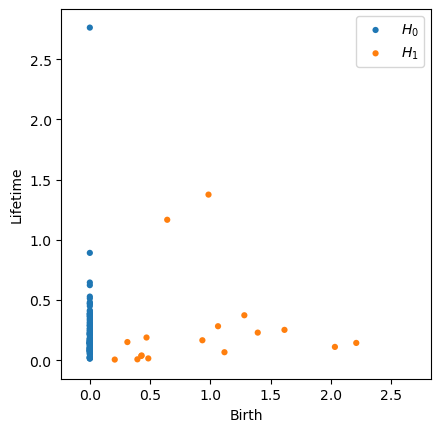

PH took 0.19099879264831543


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:342: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



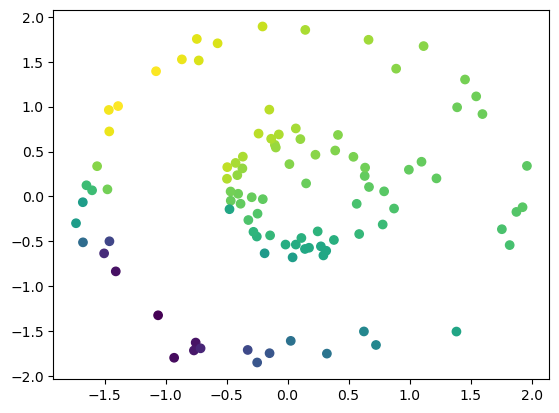

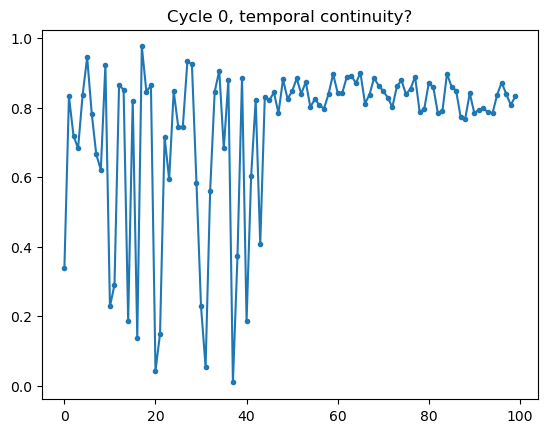

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:342: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



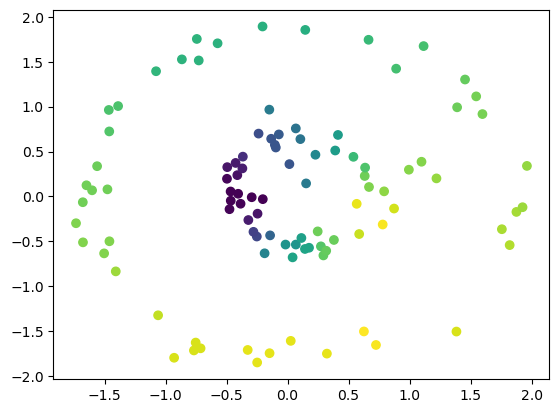

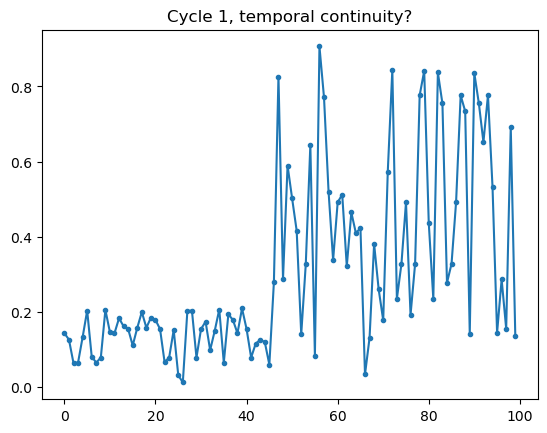

Decoding took 0.6880598068237305


In [114]:
umaph_model.fit_transform(data.T)

<Figure size 640x480 with 0 Axes>

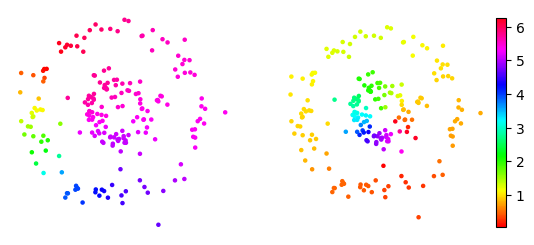

In [137]:
plt.hsv()
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure()
ax1 = fig.add_subplot(121)
ax1.axis('off')
im1 = ax1.scatter(data[:,0], data[:,1], c=umaph_model.decoded[:,0], s=5)
ax1.set_aspect(1/ax1.get_data_ratio())
ax2 = fig.add_subplot(122)
ax2.axis('off')
im2 = ax2.scatter(data[:,0], data[:,1], c=umaph_model.decoded[:,1], s=5)
ax2.set_aspect(1/ax2.get_data_ratio())
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')


## Single Circle

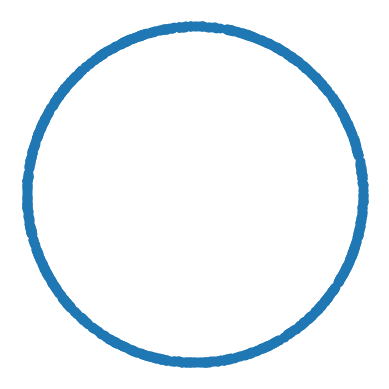

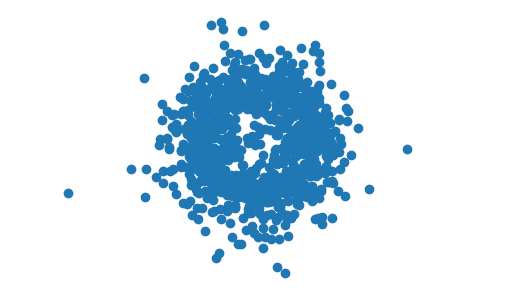

In [139]:
num_points = 1000
points = np.linspace(0,2*np.pi,num_points*5)
np.random.shuffle(points)
points = points[:num_points]
#points = np.random.ranf(num_points)*2*np.pi
circ_points = np.concatenate((np.cos(points)[:,np.newaxis],np.sin(points)[:,np.newaxis]), 1)
rand_points = np.random.laplace(circ_points, scale=0.3)
data = rand_points
nbs = 100
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(circ_points[:,0],circ_points[:,1])
ax.set_aspect('equal', 'box')
plt.axis('off')

plt.savefig('circle', bbox_inches='tight', pad_inches=0.02)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
plt.axis('off')
ax.set_xlim([-4.5,4.5])
ax.set_xlim([-4.5,4.5])

plt.savefig('circle_laplace', bbox_inches='tight', pad_inches=0.02)

In [144]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=100,
            k=100,  
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            nbs=50,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0, 1],
            compute_h2=False,
            n_points_h2=None, 
            decoding_analysis=True,
            extrapolate_closest = True )

data shape (2, 1000)
after Preprocessing data shape (1000, 2)
Preprocessing took 0.0030028820037841797
after Fuzzy Downsampling data shape (100, 2)
Fuzzy Downsampling took 2.438307285308838
distance_matrix (100, 100)
UMA took 0.009003877639770508
PH lifetime thresh 7.088685240657149


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:555: RuntimeWarning:

divide by zero encountered in log



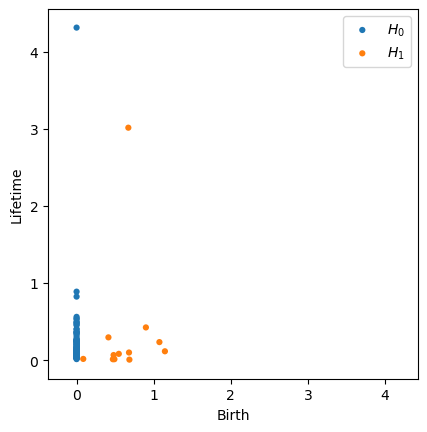

PH took 0.17200016975402832


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:342: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



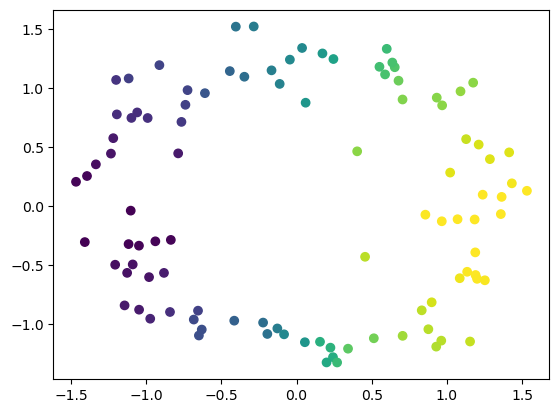

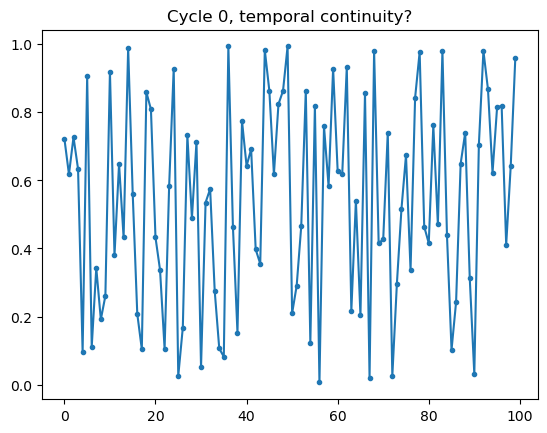

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:342: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:343: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



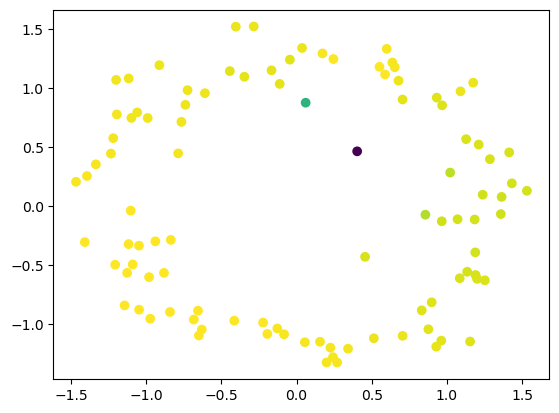

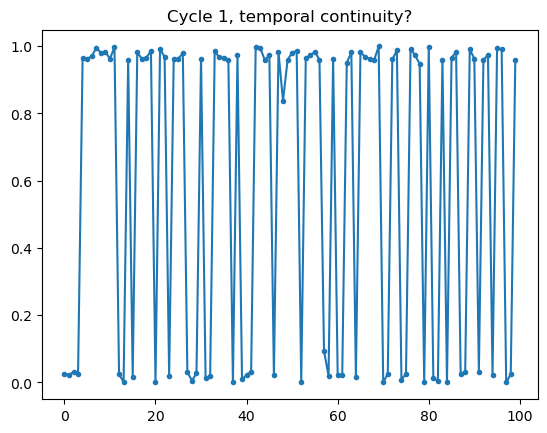

Decoding took 0.7299964427947998


In [145]:
umaph_model.fit_transform(data.T)

<Figure size 640x480 with 0 Axes>

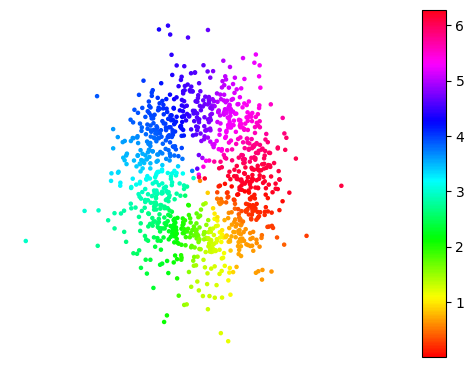

In [142]:
plt.hsv()
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.axis('off')
im1 = ax1.scatter(data[:,0], data[:,1], c=umaph_model.decoded[:,0], s=5)
ax1.set_aspect(1/ax1.get_data_ratio())
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')


### Make explanatory figure 

In [4]:
from matplotlib.patches import Circle,FancyArrowPatch, Polygon

import matplotlib.lines as mlines
from matplotlib.collections import PatchCollection

In [8]:
import os
os.mkdir('Figs/')


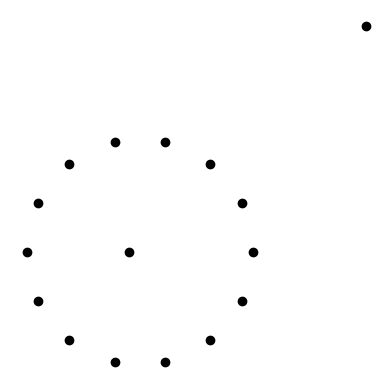

In [32]:
num_points = 1
points_big = np.linspace(0,2*np.pi,15)[:-1]
rand_points = np.zeros((num_points*len(points_big)+2,2))
r1 = 1
scale = 0.3
for i,j in enumerate(points_big):
    circ_points = np.zeros((num_points,2)) + (np.cos(j)*r1,np.sin(j)*r1)
    rand_points[i*num_points:(i+1)*num_points,:] = circ_points
    #rand_points[i*num_points:(i+1)*num_points,:] = np.random.normal(circ_points, scale=scale)
rand_points[-2,:] = (2,2)
rand_points[-1,:] = (-0.1,0)
#rand_points = rand_points[:-1,:]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1], c = 'k')
ax.set_aspect('equal', 'box')
ax.axis('off')
fig.savefig('Figs/circular_points.png', transparent = True )
fig.savefig('Figs/circular_points.pdf', transparent = True )




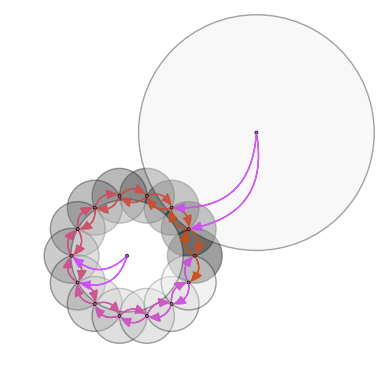

In [18]:
pts = rand_points
dists = squareform(pdist(pts))
k = 2
numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:k+1]
kdists = np.zeros((numpts, k))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)

#cols1 = np.zeros((numpts,3))
#cols11 = np.zeros((numpts,3))
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]
fc11 = [0.5,0.5,0.5]

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-2,4])
ax.set_ylim([-2,4])
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    kdists[i,:] = dists[i,kinds[i,:]]

    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=kdists[i,1],facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    ax.add_patch(c1)
    ax.add_patch(c11)
    for j in range(k):
        a1 = FancyArrowPatch(pts[i,:],pts[kinds[i,j],:],
                                 connectionstyle="arc3,rad=-.5", 
                             lw=1, alpha = 0.9, color = fc1, zorder = -1, **kw)
        ax.add_patch(a1)



ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/points_with_balls.png', transparent = True )
fig.savefig('Figs/points_with_balls.pdf', transparent = True )



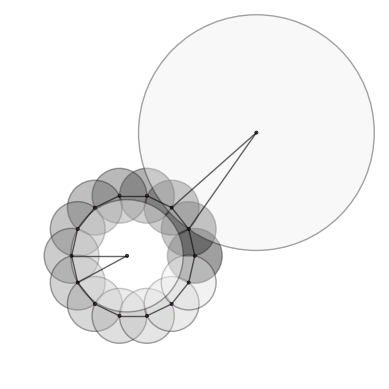

In [31]:
pts = rand_points
dists = squareform(pdist(pts))
k = 2
numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:k+1]
kdists = np.zeros((numpts, k))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)

#cols1 = np.zeros((numpts,3))
#cols11 = np.zeros((numpts,3))
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]
fc11 = [0.5,0.5,0.5]

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-2,4])
ax.set_ylim([-2,4])
edges_added = [[0.3,0.4]]
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    kdists[i,:] = dists[i,kinds[i,:]]

    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=kdists[i,1],facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    ax.add_patch(c1)
    ax.add_patch(c11)
    for j in range(k):
        if (i in np.array(edges_added)[:,1]) & (kinds[i,j] in np.array(edges_added)[:,0]):
            continue
        edges_added.append([i,kinds[i,j]])
        a1 = mlines.Line2D([pts[i,0], pts[kinds[i,j],0]], 
                           [pts[i,1], pts[kinds[i,j],1]],
                           lw=1., alpha=0.6, color = 'k', zorder = 1)
        ax.add_line(a1)

        
        
#        a1 = FancyArrowPatch(pts[i,:],pts[kinds[i,j],:],
#                                 connectionstyle="arc3,rad=-.5", 
#                             lw=1, alpha = 0.9, color = fc1, zorder = -1, **kw)
#        ax.add_patch(a1)



ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/points_with_balls_noarrows.png', transparent = True )
fig.savefig('Figs/points_with_balls_noarrows.pdf', transparent = True )



##### Use UMAPH

In [64]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=len(rand_points),
            k=100,  
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            nbs=3,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0],
            compute_h2=False,
            n_points_h2=None, 
            decoding_analysis=True,
            extrapolate_closest = True)

data shape (2, 16)
after Preprocessing data shape (16, 2)
Preprocessing took 0.006797313690185547
distance_matrix (16, 16)
UMA took 0.03633832931518555
PH lifetime thresh 0.23730268893243334


C:\Users\Finnern\OneDrive - NTNU\UMAPH\umaph.py:589: RuntimeWarning: divide by zero encountered in log
  d = - np.log(d)


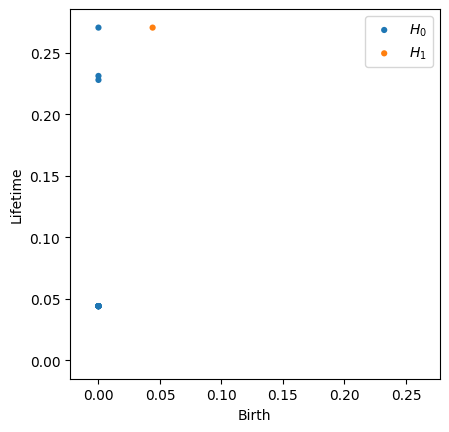

PH took 0.5129332542419434
Threshold is infinite, using birth*1.5 as threshold


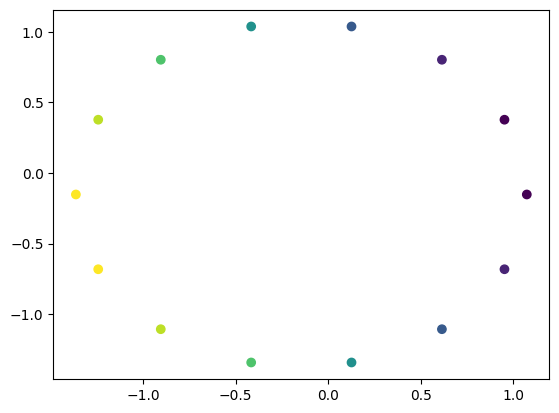

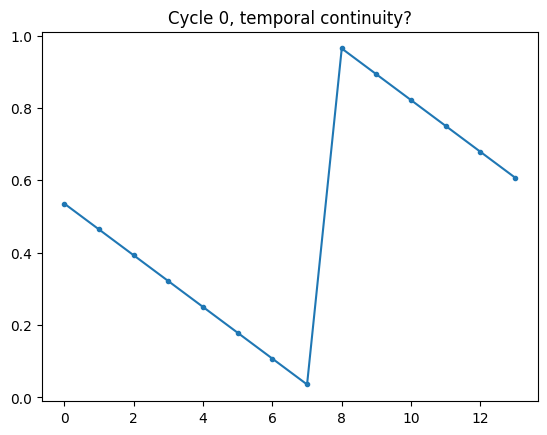

In [65]:
umaph_model.fit_transform(rand_points.T)

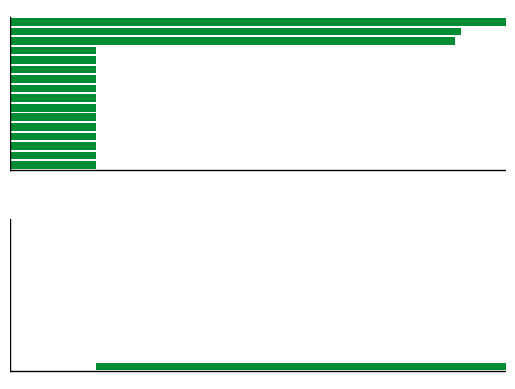

In [67]:
umaph_model.plot_barcode()

In [69]:
umaph_model.rips_real['dgms']

[array([[0.        , 0.04400527],
        [0.        , 0.04400527],
        [0.        , 0.04401049],
        [0.        , 0.04401049],
        [0.        , 0.04401049],
        [0.        , 0.04401049],
        [0.        , 0.04402056],
        [0.        , 0.04402056],
        [0.        , 0.04402056],
        [0.        , 0.04402056],
        [0.        , 0.04402826],
        [0.        , 0.04402826],
        [0.        , 0.04402826],
        [0.        , 0.22789925],
        [0.        , 0.23114344],
        [0.        ,        inf]]),
 array([[0.04402826,        inf]])]

0


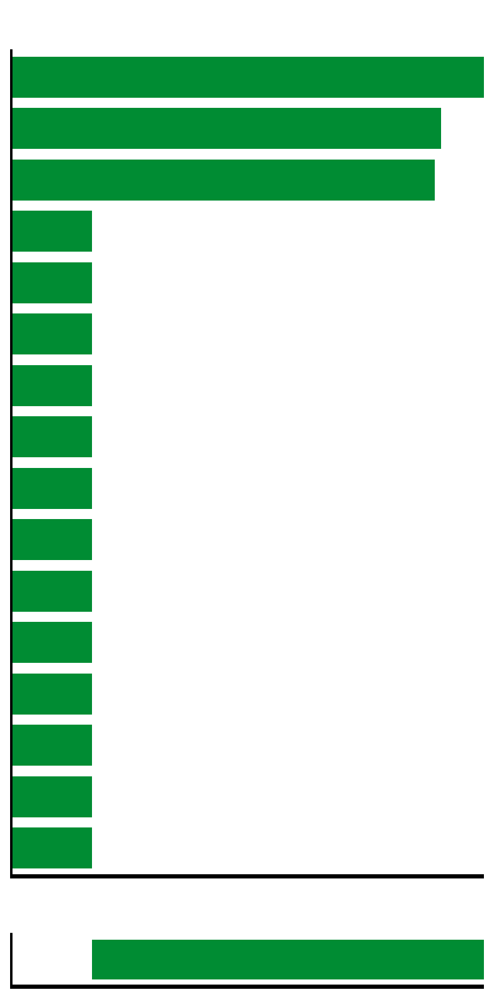

In [71]:
fig = plot_barcode(umaph_model.rips_real['dgms'])

fig.savefig('Figs/umaphbarcode.png', transparent = True )
fig.savefig('Figs/umaphbarcode.pdf', transparent = True )

In [227]:
from matplotlib import gridspec, transforms, pyplot as plt

def plot_barcode(persistence, file_name = '', shuffle_name = ''):
    if np.sum(np.isinf(persistence[0])) == 0:
        persistence[0] = np.concatenate((persistence[0], np.array([0,np.inf])[np.newaxis, :]),0)

    diagrams_roll = {}
    if len(shuffle_name)>0:
        f = np.load(shuffle_name + '.npz', allow_pickle = True)
        diagrams_roll = f['dgms_shuffles'][()]
        f.close() 

    alpha=1
    inf_delta=0.1
    legend=True
    maxdim = len(persistence)-1
    cs = np.repeat([[0,0.55,0.2]],maxdim+1).reshape(3, maxdim+1).T
    colormap=cs
    dims =np.arange(maxdim+1)
    num_rolls = len(diagrams_roll)
    print(num_rolls)
    if num_rolls>0:
        diagrams_all = np.copy(diagrams_roll[0][0])
        for i in np.arange(1, num_rolls):
            for d in dims:
                diagrams_all[d] = np.concatenate((diagrams_all[d], diagrams_roll[i][0][d]),0)
        infs = np.isinf(diagrams_all[0])
        diagrams_all[0][infs] = 0
        diagrams_all[0][infs] = np.max(diagrams_all[0])
        infs = np.isinf(diagrams_all[0])
        diagrams_all[0][infs] = 0
        diagrams_all[0][infs] = np.max(diagrams_all[0])


    min_birth, max_death = 0,0            
    for dim in dims:
        persistence_dim = persistence[dim][~np.isinf(persistence[dim][:,1]),:]
        if len(persistence_dim)>0:
            min_birth = min(min_birth, np.min(persistence_dim))
            max_death = max(max_death, np.max(persistence_dim))
    delta = (max_death - min_birth) * inf_delta
    infinity = max_death + delta
    axis_start = min_birth - delta            
    plotind = (dims[-1]+1)*100 + 10 +1
    fig = plt.figure(figsize = (5,10), dpi = 160)
    gs = gridspec.GridSpec(len(dims),1, height_ratios = [min(len(persistence[dim]),30) for dim in dims])
    indsall =  0
    labels = ["$H_0$", "$H_1$", "$H_2$"]
    for dit, dim in enumerate(dims):
        axes = plt.subplot(gs[dim])
        axes.axis('off')
        d = np.copy(persistence[dim])
        d[np.isinf(d[:,1]),1] = infinity
        dlife = (d[:,1] - d[:,0])
        if len(dlife)>1:
            dinds = np.argsort(dlife)[-30:]
            dl1,dl2 = dlife[dinds[-2:]]
        else:
            dinds = np.array([0])
        if dim>0:
            dinds = dinds[np.flip(np.argsort(d[dinds,0]))]
        axes.barh(
            0.5+np.arange(len(dinds)),
            dlife[dinds],
            height=0.8,
            left=d[dinds,0],
            alpha=alpha,
            color=colormap[dim],
            linewidth=0,
        )
        indsall = len(dinds)
        if num_rolls>0:
            bins = 50
            cs = np.flip([[0.4,0.4,0.4], [0.6,0.6,0.6], [0.8, 0.8,0.8]])
            cs = np.repeat([[1,0.55,0.1]],3).reshape(3,3).T
            cc = 0
            lives1_all = diagrams_all[dim][:,1] - diagrams_all[dim][:,0]
            x1 = np.linspace(diagrams_all[dim][:,0].min()-1e-5, diagrams_all[dim][:,0].max()+1e-5, bins-2)
            
            dx1 = (x1[1] - x1[0])
            x1 = np.concatenate(([x1[0]-dx1], x1, [x1[-1]+dx1]))
            dx = x1[:-1] + dx1/2
            ytemp = np.zeros((bins-1))
            binned_birth = np.digitize(diagrams_all[dim][:,0], x1)-1
            x1  = d[dinds,0]
            ytemp =x1 + np.max(lives1_all)
            axes.fill_betweenx(0.5+np.arange(len(dinds)), x1, ytemp, color = cs[(dim)], zorder = -2, alpha = 0.3)

        axes.plot([0,0], [-0.5, indsall], c = 'k', linestyle = '-', lw = 3)
        axes.plot([0,infinity],[-0.5,-0.5], c = 'k', linestyle = '-', lw = 3)
        axes.set_xlim([0, infinity])
        print(infinity)
    
    plt.tight_layout()
    return fig

##### Use PH

In [20]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=len(rand_points),
            k=100,  
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0],
            compute_h2=False,
            n_points_h2=None, 
            decoding_analysis=True,
            bUMA = False
            )

data shape (2, 16)
after Preprocessing data shape (16, 2)
Preprocessing took 0.0038933753967285156
PH lifetime thresh 4.661465450338867


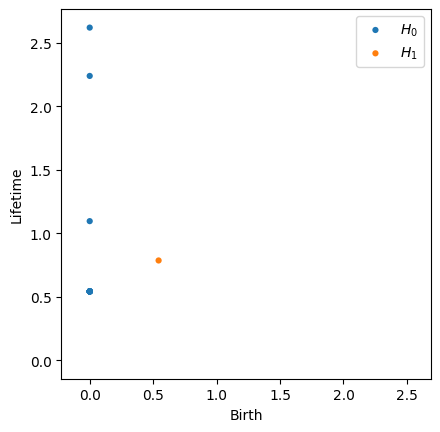

PH took 0.36282944679260254


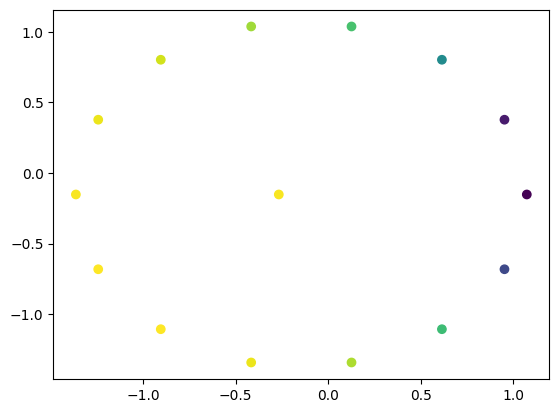

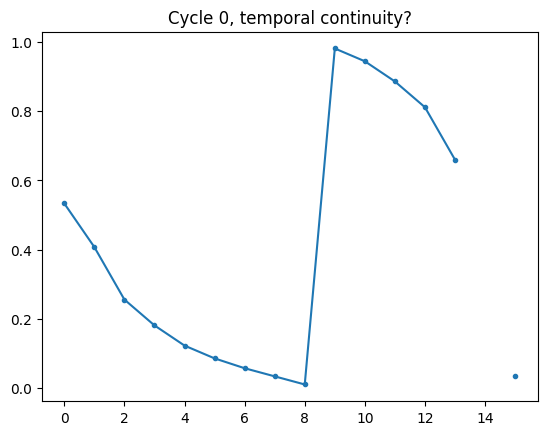

In [21]:
umaph_model.fit_transform(rand_points.T)

<Figure size 640x480 with 0 Axes>

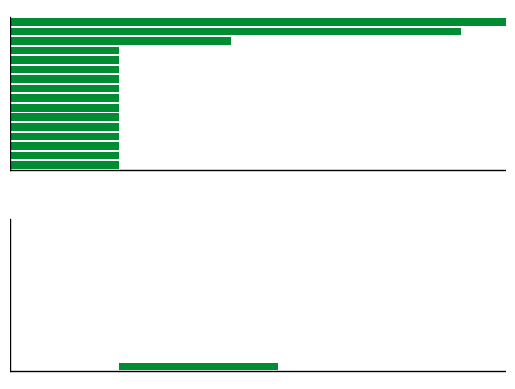

In [22]:
plt.figure()
umaph_model.plot_barcode()

fig.savefig('Figs/PH_barcode.png', transparent = True )
fig.savefig('Figs/PH_barcode.pdf', transparent = True )

##### Plot illustrative figures

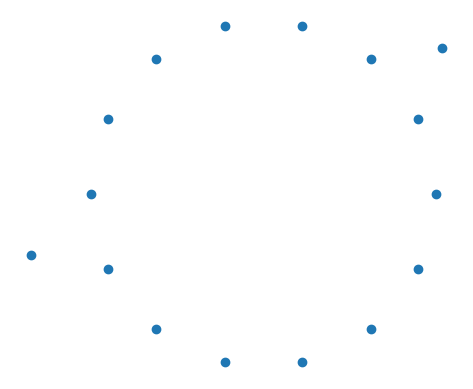

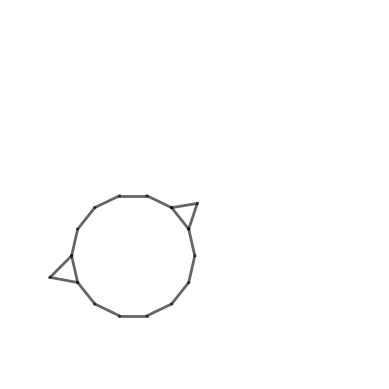

In [23]:
num_points = 1
points_big = np.linspace(0,2*np.pi,15)[:-1]
rand_points = np.zeros((num_points*len(points_big)+2,2))
r1 = 1
scale = 0.3
for i,j in enumerate(points_big):
    circ_points = np.zeros((num_points,2)) + (np.cos(j)*r1,np.sin(j)*r1)
    rand_points[i*num_points:(i+1)*num_points,:] = circ_points
    #rand_points[i*num_points:(i+1)*num_points,:] = np.random.normal(circ_points, scale=scale)
rand_points[-2,:] = (1.04,0.85)
rand_points[-1,:] = (-1.35,-0.35)
#rand_points = rand_points[:-1,:]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
ax.axis('off')




pts = rand_points
dists = squareform(pdist(pts))

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-2,4])
ax.set_ylim([-2,4])

k = 2
numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:k+1]
kdists = np.zeros((numpts, k))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)

#cols1 = np.zeros((numpts,3))
#cols11 = np.zeros((numpts,3))
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]

edges_added = [[0.3,0.4]]
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    kdists[i,:] = dists[i,kinds[i,:]]
    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=kdists[i,-1],facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    for j in range(k):
        if (i in np.array(edges_added)[:,1]) & (kinds[i,j] in np.array(edges_added)[:,0]):
            continue
        edges_added.append([i,kinds[i,j]])
        a1 = mlines.Line2D([pts[i,0], pts[kinds[i,j],0]], 
                           [pts[i,1], pts[kinds[i,j],1]],
                           lw=2., alpha=0.6, color = 'k', zorder = 1)
        ax.add_line(a1)
ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/UMAP_connectivity.png', transparent = True )
fig.savefig('Figs/UMAP_connectivity.pdf', transparent = True )


[1 2] [14  2] [14  1]
[7 8] [15  8] [15  7]


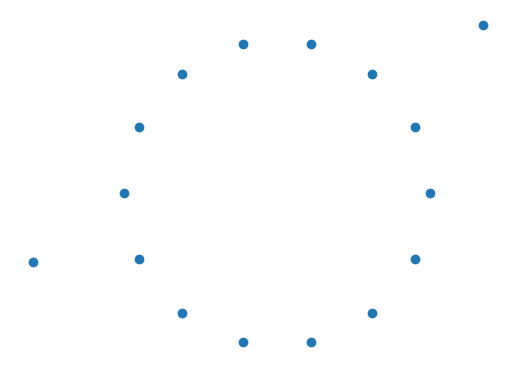

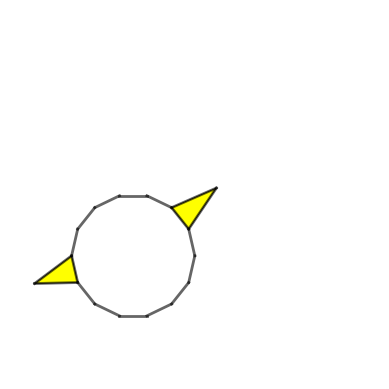

In [24]:
num_points = 1
points_big = np.linspace(0,2*np.pi,15)[:-1]
rand_points = np.zeros((num_points*len(points_big)+2,2))
r1 = 1
scale = 0.3
for i,j in enumerate(points_big):
    circ_points = np.zeros((num_points,2)) + (np.cos(j)*r1,np.sin(j)*r1)
    rand_points[i*num_points:(i+1)*num_points,:] = circ_points
rand_points[-2,:] = (1.35,1.1)
rand_points[-1,:] = (-1.6,-0.45)

#rand_points = rand_points[:-1,:]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
ax.axis('off')


pts = rand_points
dists = squareform(pdist(pts))

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-2,4])
ax.set_ylim([-2,4])

k = 2
numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:k+1]
kdists = np.zeros((numpts, k))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]

edges_added = [[0,0]]
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    kdists[i,:] = dists[i,kinds[i,:]]
    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=kdists[i,-1]/2,facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    for j in range(k):
        if (i in np.array(edges_added)[:,1]) & (kinds[i,j] in np.array(edges_added)[:,0]):
            continue
        edges_added.append([i,kinds[i,j]])
        a1 = mlines.Line2D([pts[i,0], pts[kinds[i,j],0]], 
                           [pts[i,1], pts[kinds[i,j],1]],
                           lw=2., alpha=0.6, color = 'k', zorder = 1)
        ax.add_line(a1)
        
        

        
edges_added = np.array(edges_added)
edges_added = edges_added[1:,:]
num_edges = len(edges_added[:,0])
tc =[1,1,0]
for i in np.arange(0,num_edges):
    e1 = edges_added[i,:]
    for j in np.arange(i+1,num_edges):
        e2 = edges_added[j,:]
        for k in np.arange(j+1,num_edges):
            e3 = edges_added[k,:]
            vs = np.unique([e1,e2,e3])
            if len(vs)==3:
                print(e1,e2,e3)
                t1 = Polygon([pts[vs[0]],pts[vs[1]],pts[vs[2]]], 
                             facecolor = tc, edgecolor = ec1, 
                             lw = 0.5, zorder = -1)
                ax.add_patch(t1)

ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/UMAP_connectivity.png', transparent = True )
fig.savefig('Figs/UMAP_connectivity.pdf', transparent = True )


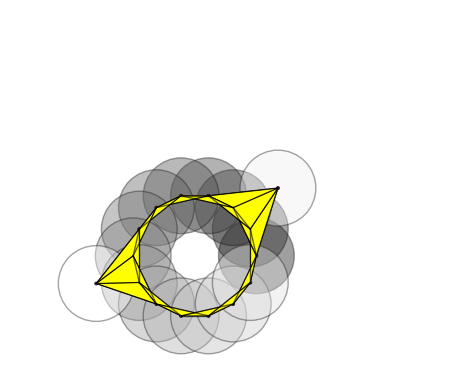

In [25]:
dists = squareform(pdist(pts))

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-3,4])
ax.set_ylim([-2,4])

numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:]
kdists = np.zeros((numpts, numpts))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)

#cols1 = np.zeros((numpts,3))
#cols11 = np.zeros((numpts,3))
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]
eps =  1.23
edges_added = [[0,0]]
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    k = sum(dists[i,:]<=eps)-1
#    print(k)
    
    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=eps/2,facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    ax.add_patch(c1)
    ax.add_patch(c11)
    for j in range(k):
        if (i in np.array(edges_added)[:,1]) & (kinds[i,j] in np.array(edges_added)[:,0]):
            continue
        edges_added.append([i,kinds[i,j]])
        a1 = mlines.Line2D([pts[i,0], pts[kinds[i,j],0]], 
                           [pts[i,1], pts[kinds[i,j],1]],
                           lw=1., alpha=0.6, color = 'k', zorder = 1)
        ax.add_line(a1)
        

        
edges_added = np.array(edges_added)
edges_added = edges_added[1:,:]
num_edges = len(edges_added[:,0])
tc =[1,1,0]
for i in np.arange(0,num_edges):
    e1 = edges_added[i,:]
    for j in np.arange(i+1,num_edges):
        e2 = edges_added[j,:]
        for k in np.arange(j+1,num_edges):
            e3 = edges_added[k,:]
            vs = np.unique([e1,e2,e3])
            if len(vs)==3:
#                print(e1,e2,e3)
                t1 = Polygon([pts[vs[0]],pts[vs[1]],pts[vs[2]]], 
                             facecolor = tc, edgecolor = ec1, 
                             lw = 0.5, zorder = -1)
                ax.add_patch(t1)

# add a line
#x, y = ([-0.06, 0.0, 0.1], [0.05, -0.05, 0.05])
#label(grid[8], "Line2D")
ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/UMAP_connectivity2.png', transparent = True )
fig.savefig('Figs/UMAP_connectivity2.pdf', transparent = True )

#plt.savefig('Figs/Final/umaph_complex')

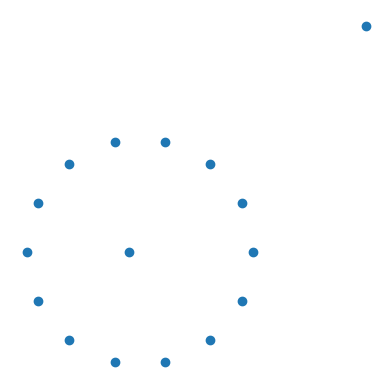

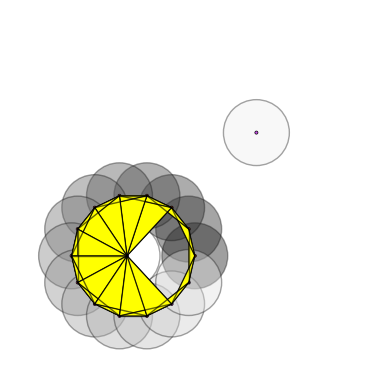

In [26]:

num_points = 1
points_big = np.linspace(0,2*np.pi,15)[:-1]
rand_points = np.zeros((num_points*len(points_big)+2,2))
r1 = 1
scale = 0.3
for i,j in enumerate(points_big):
    circ_points = np.zeros((num_points,2)) + (np.cos(j)*r1,np.sin(j)*r1)
    rand_points[i*num_points:(i+1)*num_points,:] = circ_points
    #rand_points[i*num_points:(i+1)*num_points,:] = np.random.normal(circ_points, scale=scale)
rand_points[-2,:] = (2,2)
rand_points[-1,:] = (-0.1,0)
#rand_points = rand_points[:-1,:]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
ax.axis('off')





pts = rand_points
dists = squareform(pdist(pts))

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_xlim([-2,4])
ax.set_ylim([-2,4])

numpts = len(pts[:,0])
kinds = np.argsort(dists,1)[:,1:]
kdists = np.zeros((numpts, numpts))
style = "Simple, tail_width=0., head_width=6, head_length=7"
kw = dict(arrowstyle=style)

#cols1 = np.zeros((numpts,3))
#cols11 = np.zeros((numpts,3))
ec1 = [0,0,0]
ec11 = [0.1,0.1,0.1]
eps =  1.07
edges_added = [[0,0]]
for i in range(numpts):
    fc1 = [0.8,0.3,(i+1)*1/numpts]
    fc11 = [(i+1)*1/numpts,(i+1)*1/numpts,(i+1)*1/numpts]
    k = sum(dists[i,:]<=eps)-1
#    print(k)
    
    c1 =  Circle(pts[i,:], radius=0.025, facecolor = fc1, edgecolor = ec1, lw = 0.5, zorder = -1)
    c11 = Circle(pts[i,:], radius=eps/2,facecolor = fc11, edgecolor = ec11, 
                 alpha = 0.4, zorder = -2)
    ax.add_patch(c1)
    ax.add_patch(c11)
    for j in range(k):
        if (i in np.array(edges_added)[:,1]) & (kinds[i,j] in np.array(edges_added)[:,0]):
            continue
        edges_added.append([i,kinds[i,j]])
        a1 = mlines.Line2D([pts[i,0], pts[kinds[i,j],0]], 
                           [pts[i,1], pts[kinds[i,j],1]],
                           lw=1., alpha=0.6, color = 'k', zorder = 1)
        ax.add_line(a1)
        

        
edges_added = np.array(edges_added)
edges_added = edges_added[1:,:]
num_edges = len(edges_added[:,0])
tc =[1,1,0]
for i in np.arange(0,num_edges):
    e1 = edges_added[i,:]
    for j in np.arange(i+1,num_edges):
        e2 = edges_added[j,:]
        for k in np.arange(j+1,num_edges):
            e3 = edges_added[k,:]
            vs = np.unique([e1,e2,e3])
            if len(vs)==3:
#                print(e1,e2,e3)
                t1 = Polygon([pts[vs[0]],pts[vs[1]],pts[vs[2]]], 
                             facecolor = tc, edgecolor = ec1, 
                             lw = 0.5, zorder = -1)
                ax.add_patch(t1)
ax.axis('off')
ax.set_aspect('equal', 'box')
fig.savefig('Figs/PH_connectivity.png', transparent = True )
fig.savefig('Figs/PH_connectivity.pdf', transparent = True )

#plt.savefig('Figs/Final/rips_complex')

(-1.15, 2.15, -1.1236743077909148, 2.1487463956090913)

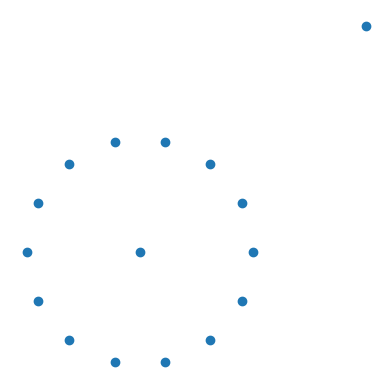

In [247]:
num_points = 1
points_big = np.linspace(0,2*np.pi,15)[:-1]
rand_points = np.zeros((num_points*len(points_big)+2,2))
r1 = 0.1
scale = 0.3
for i,j in enumerate(points_big):
    circ_points = np.zeros((num_points,2)) + (np.cos(j),np.sin(j))
    rand_points[i*num_points:(i+1)*num_points,:] = circ_points
    #rand_points[i*num_points:(i+1)*num_points,:] = np.random.normal(circ_points, scale=scale)
rand_points[-1,:] = (2,2)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')
ax.axis('off')





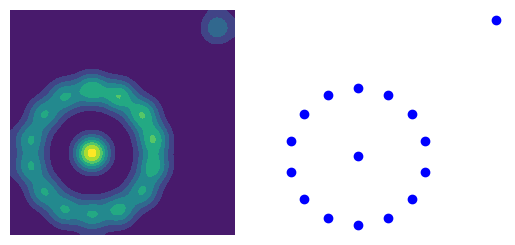

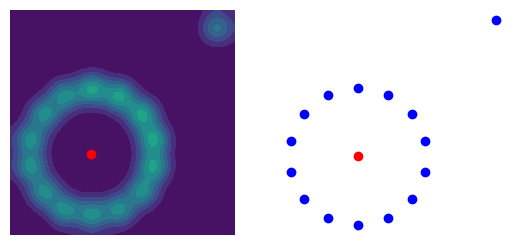

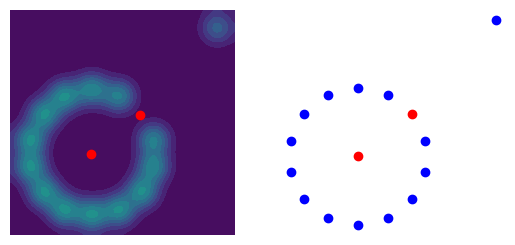

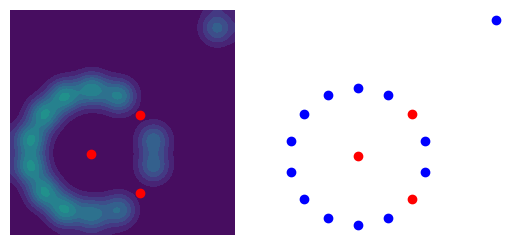

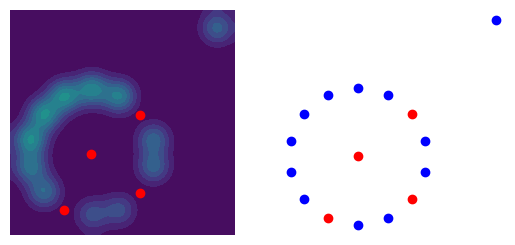

...

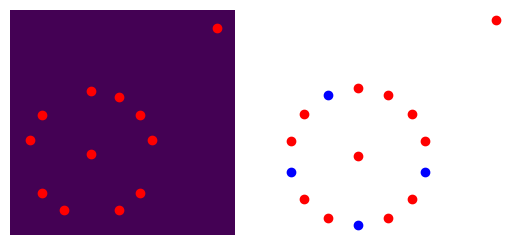

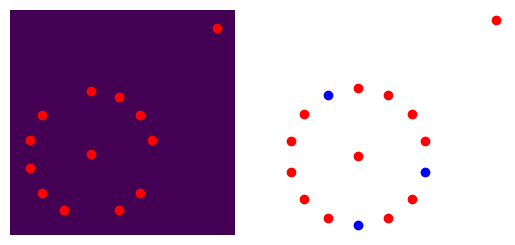

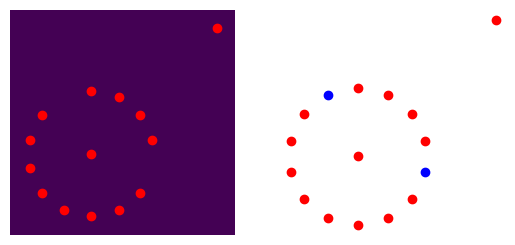

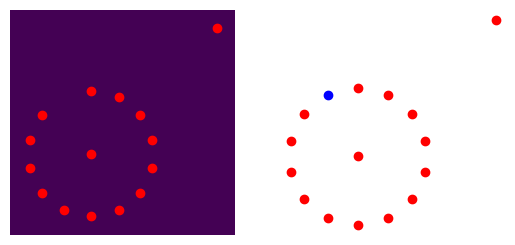

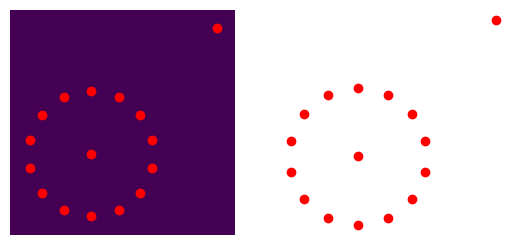

In [260]:
from scipy.ndimage import gaussian_filter
data = rand_points.copy()
metric = 'euclidean'  
num_sample = len(rand_points[:,0])
omega = 1

sig = 5
sz = 100
dax = np.max(rand_points)- np.min(rand_points)
axxs = np.linspace(np.min(rand_points)-0.1*dax, np.max(rand_points)+0.1*dax, sz)
X1,Y1 = np.meshgrid(axxs, axxs)

digX = np.digitize(rand_points[:,0], axxs)
digY = np.digitize(rand_points[:,1], axxs)

vmin = 0
vmax = 0

for k in [6]: 
    n = data.shape[0]
    F_D = np.zeros(n)

    X = squareform(pdist(data, metric))
    knn_indices = np.argsort(X,1)[:,:k]
    knn_dists = np.zeros(np.shape(knn_indices))
    for ii in range(len(X)):
        knn_dists[ii,:] = X[ii,knn_indices[ii,:]]

#    sigmas = np.sum(knn_dists,1)
    #    sigmas = np.mean(knn_dists,1)

    sigmas, rhos = smooth_knn_dist(knn_dists, k, local_connectivity=0)
    rows, cols, vals = compute_membership_strengths(knn_indices, knn_dists, sigmas, np.zeros_like(sigmas))
    result = coo_matrix((vals, (rows, cols)), shape=(n, n))
    result.eliminate_zeros()
    transpose = result.transpose()
    prod_matrix = result.multiply(transpose)
    result = (result + transpose - prod_matrix)
    result.eliminate_zeros()
    X = result.toarray()
    F = np.sum(X,1)
    Z1 = np.zeros((sz,sz))
    for g in range(len(rand_points)):
        Z1[digX[g],digY[g]] = F[g]
    Z1 = gaussian_filter(Z1, sigma = sig)
    vmin = Z1.min()
    vmax = Z1.max()
    
#    Z1[Z1<1e-5] = -np.inf
    fig, axs = plt.subplots(1, 2)
    ax = axs[0]
    ax.contourf(X1, Y1, Z1, vmin = vmin, vmax = vmax)
#    ax.scatter(rand_points[inds[:j+1],1],rand_points[inds[:j+1],0],c = 'r')
    ax.axis('off')
    ax.set_aspect(1/ax.get_data_ratio())
    ax = axs[1]
    ax.scatter(rand_points[:,1],rand_points[:,0], c = 'b')
    ax.axis('off')
    ax.set_aspect(1/ax.get_data_ratio())
#    fig.savefig('Fuzzy_downsampling_circle/k'+ str(k) + '_all')

    
    i = np.argmax(F)
    inds_all = np.arange(n)
    inds_left = inds_all>-1
    inds_left[i] = False
    inds = np.zeros(num_sample, dtype = int)
    j = 0
    inds[j] = i
    F -= omega*X[i,:]

    ileft = np.where(inds_left)[0]

    Z1 = np.zeros((sz,sz))
    for g in ileft:
        Z1[digX[g],digY[g]] = F[g]
    Z1 = gaussian_filter(Z1, sigma = sig)
#    Z1[Z1<1e-5] = -np.inf
    fig, axs = plt.subplots(1, 2)
    ax = axs[0]
    ax.contourf(X1, Y1, Z1, vmin = vmin, vmax = vmax)
    ax.scatter(rand_points[inds[:j+1],1],rand_points[inds[:j+1],0],c = 'r')
    ax.axis('off')
    ax.set_aspect(1/ax.get_data_ratio())
    ax = axs[1]
    ax.scatter(rand_points[inds[:j+1],1],rand_points[inds[:j+1],0], c = 'r')
    ax.scatter(rand_points[ileft,1],rand_points[ileft,0], c = 'b')
    ax.axis('off')
    ax.set_aspect(1/ax.get_data_ratio())
    fig.savefig('Fuzzy_downsampling_circle/k'+ str(k) + '_j' + str(j))

    xylim = (axxs[0], axxs[-1]) 
    Fs = np.zeros(num_sample)
    Fs[j] = np.max(F)
    for j in np.arange(1,num_sample):

        Fmax = np.argmax(F[inds_left])
        Fs[j] = F[Fmax]
        i = inds_all[inds_left][Fmax]

        inds_left[i] = False   
        inds[j] = i
        F -= omega*X[i,:]

        Z1 = np.zeros((sz,sz))
        ileft = np.where(inds_left)[0]
        for g in ileft:#range(len(rand_points)):
            Z1[digX[g],digY[g]] = F[g]
        Z1 = gaussian_filter(Z1, sigma = sig)
    #    Z1[Z1<1e-10] = -np.inf
        fig, axs = plt.subplots(1, 2)
        ax = axs[0]
        ax.contourf(X1, Y1, Z1, vmin = vmin, vmax = vmax)
        ax.scatter(rand_points[inds[:j+1],1],rand_points[inds[:j+1],0],c = 'r')
        ax.axis('off')
        ax.set_aspect(1/ax.get_data_ratio())
        ax = axs[1]
        ax.scatter(rand_points[inds[:j+1],1],rand_points[inds[:j+1],0], c = 'r')
        ax.scatter(rand_points[ileft,1],rand_points[ileft,0], c = 'b')
        ax.axis('off')
        ax.set_aspect(1/ax.get_data_ratio())
#        ax.set_xlim(xylim)
#        ax.set_ylim(xylim)
#        fig.savefig('Fuzzy_downsampling_circle/k'+ str(k) + '_j' + str(j))

        plt.show()
    

# Many circles in a circle

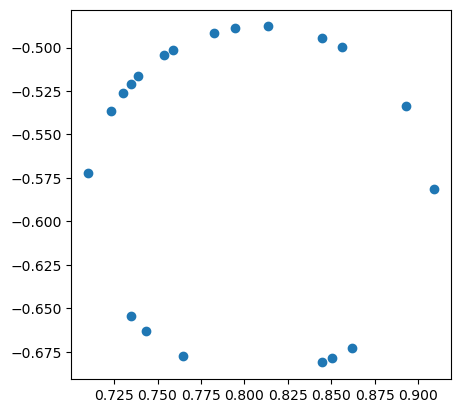

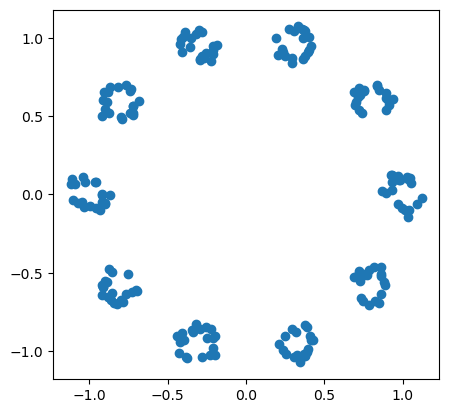

In [261]:
num_points = 20
points_big = np.linspace(0,2*np.pi,11)[:-1]
rand_points = np.zeros((200,2))
r1 = 0.1
scale = 0.02
for i,j in enumerate(points_big):
    points = np.linspace(0,2*np.pi,num_points*5)
    np.random.shuffle(points)
    points = points[:num_points]
    #points = np.random.ranf(num_points)*2*np.pi
    circ_points = np.concatenate((r1*np.cos(points)[:,np.newaxis],r1*np.sin(points)[:,np.newaxis]), 1) + (np.cos(j),np.sin(j))
    rand_points[i*20:(i+1)*20,:] = np.random.normal(circ_points, scale=scale)
    

fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(circ_points[:,0],circ_points[:,1])
ax.set_aspect('equal', 'box')

fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(rand_points[:,0],rand_points[:,1])
ax.set_aspect('equal', 'box')

In [266]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=len(rand_points),
            k=100,  
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0,1,2,3,4,5,6,7,8,9,10],
            compute_h2=False,
            n_points_h2=None, 
            decoding_analysis=True,
            )

data shape (2, 200)
after Preprocessing data shape (200, 2)
Preprocessing took 0.0019195079803466797
distance_matrix (200, 200)
UMA took 0.024030208587646484
PH lifetime thresh 15.472574362703636


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:566: RuntimeWarning:

divide by zero encountered in log



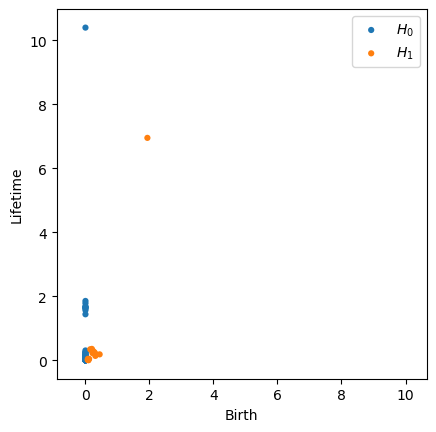

PH took 0.21804523468017578


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



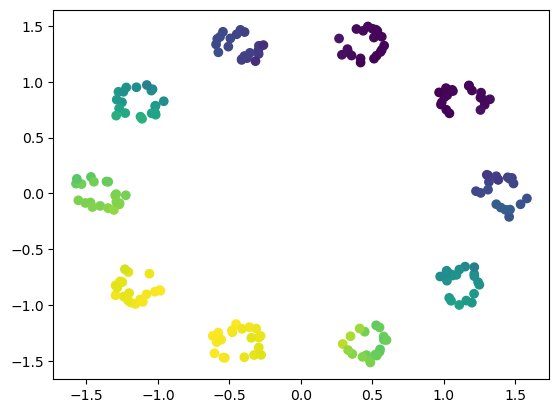

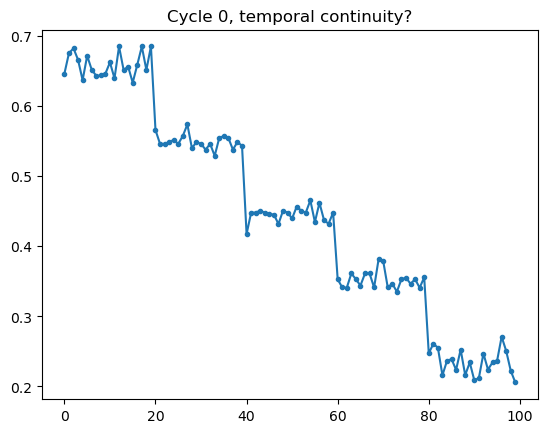

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



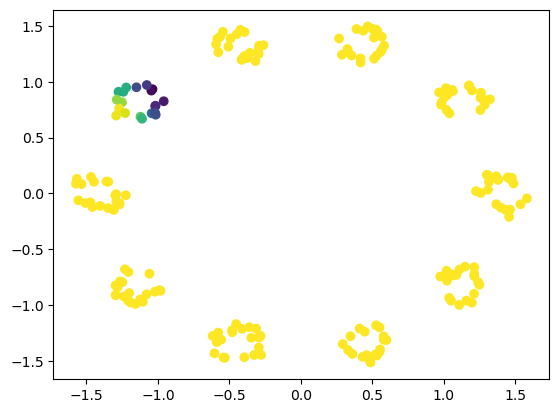

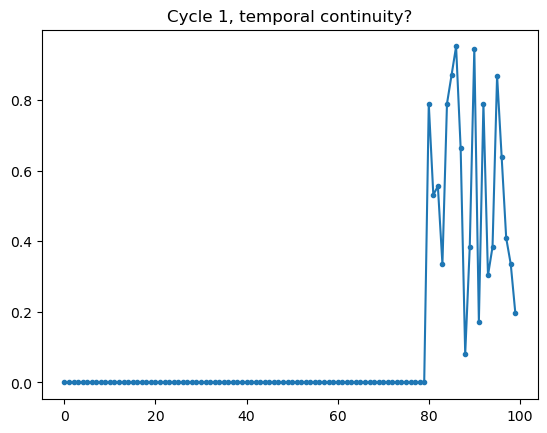

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



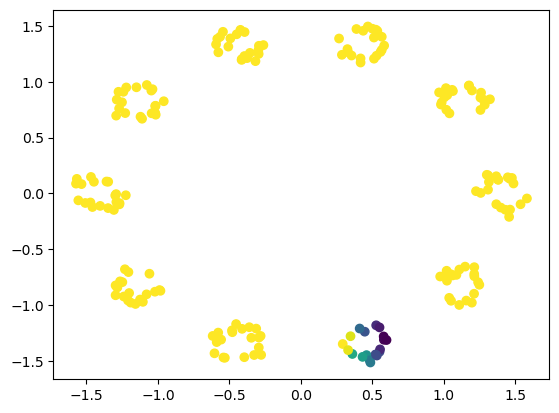

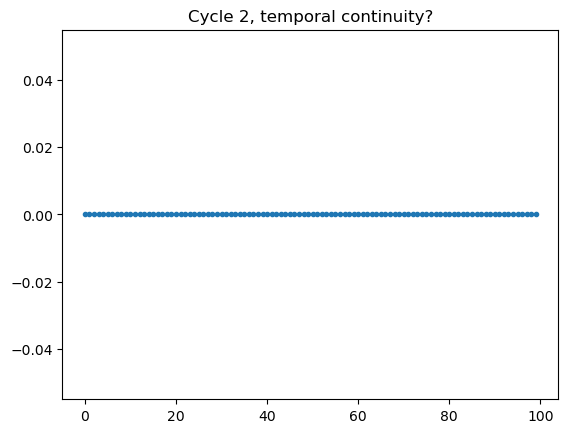

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



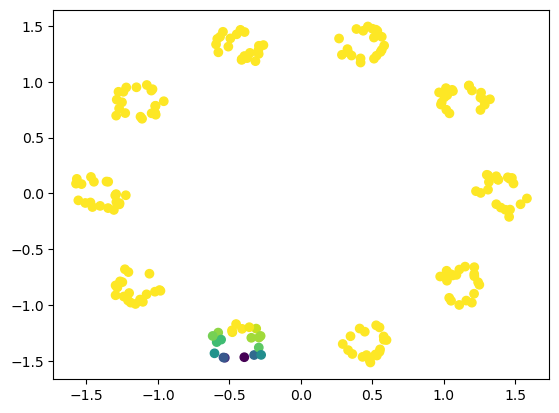

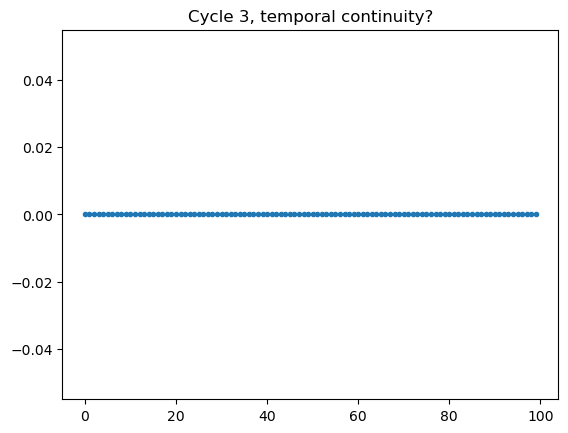

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



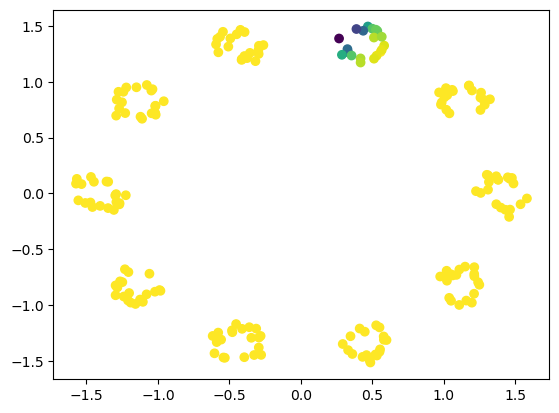

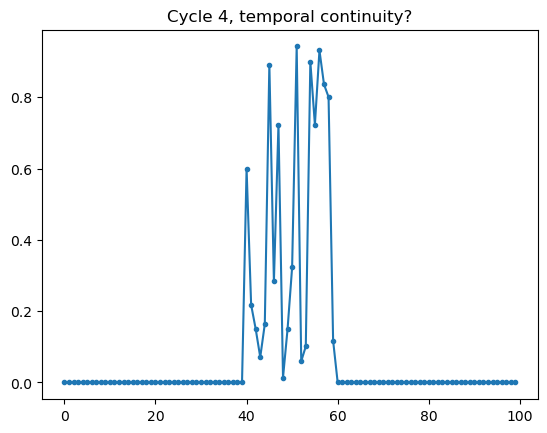

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



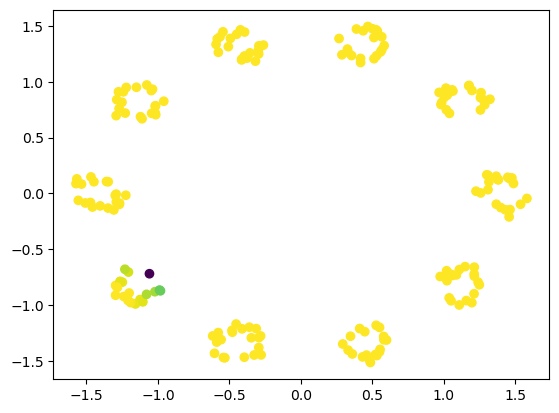

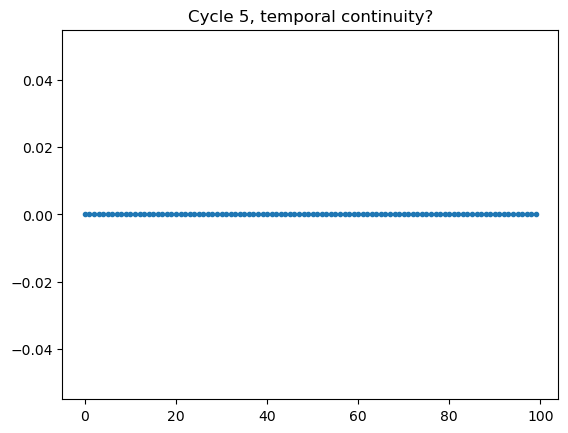

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



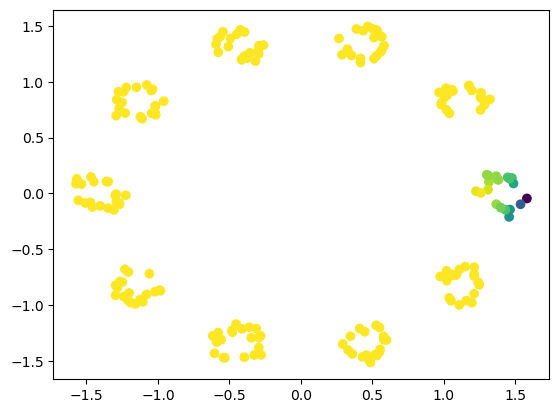

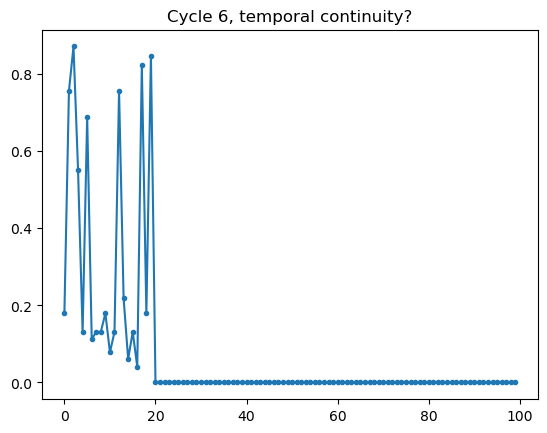

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



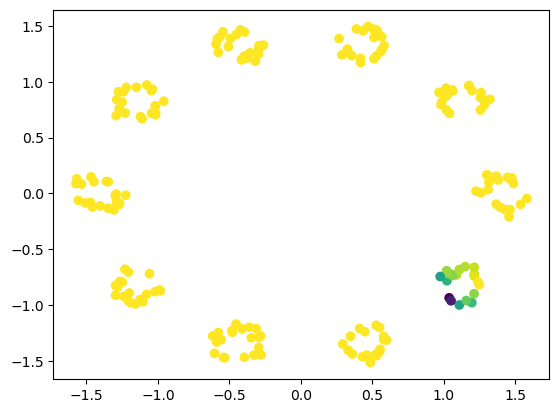

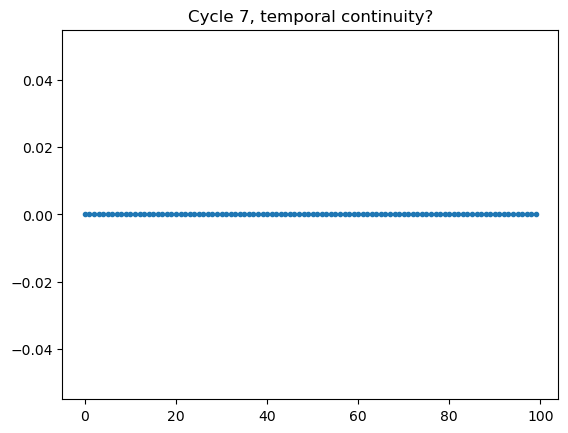

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



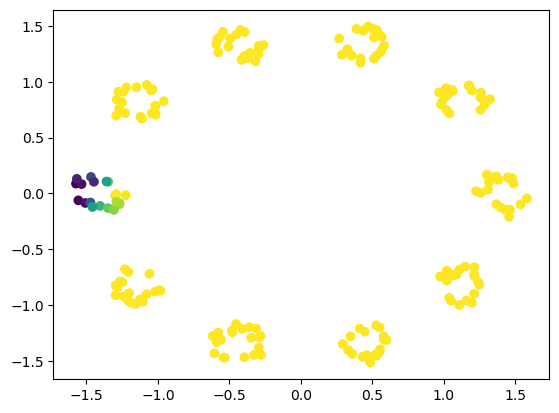

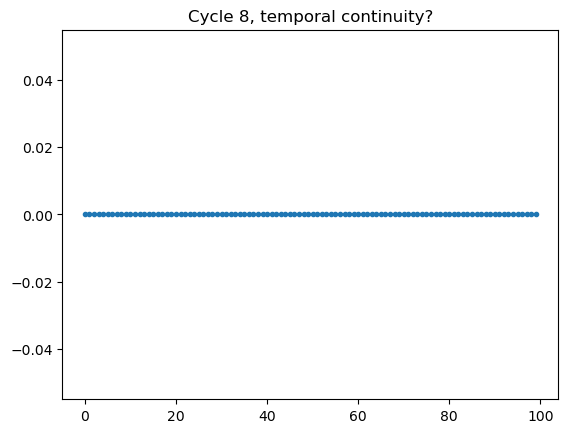

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



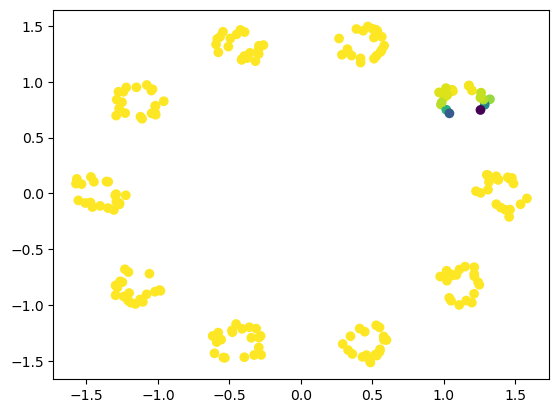

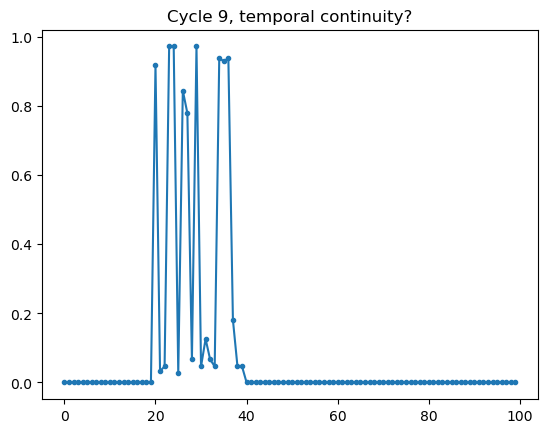

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.



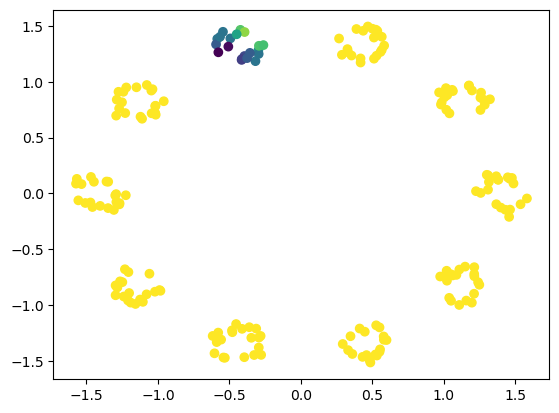

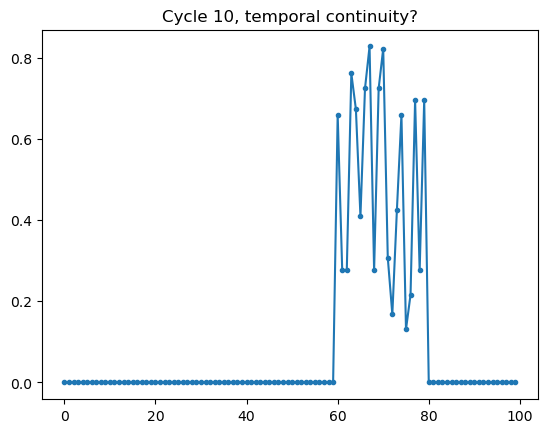

In [267]:
umaph_model.fit_transform(rand_points.T)

# Clifford torus (square 2-torus in 4D)

In [2]:
## clifagonal torus

a_1 = 1
a_2 = 1
b_3 = 1
num_points = 10000
clif_tor = np.zeros((num_points,4))
clif_tor_true = np.zeros((num_points,4))
angs =  np.zeros((num_points,2))
xx = np.zeros(num_points)
yy = np.zeros(num_points)
rot_mat = []
#x,y = np.meshgrid(np.linspace(0,1, 52)[1:-1], np.linspace(0,1, 52)[1:-1])
x,y = np.meshgrid(np.linspace(0,1, int(np.sqrt(num_points))+1)[:-1],  
                  np.linspace(0,1, int(np.sqrt(num_points))+1))
x = x.flatten()*2*np.pi
y = y.flatten()*2*np.pi
C_1, C_2 = 1,1

for n in range(num_points):
    u,v = x[n],y[n]
    u += (np.random.rand()-0.5)*3
    v += (np.random.rand()-0.5)*3
    angs[n,:] = (u,v)
    f1 = C_1 *np.cos(v)
    f2 = C_1 *np.sin(v)
    f3 = C_2 *np.cos(u)
    f4 = C_2 *np.sin(u)
    clif_tor_true[n,:] = (f1,f2,f3,f4)
    clif_tor[n,:] = np.random.laplace((f1,f2,f3,f4), scale=0.2)
inds = np.arange(num_points)
np.random.shuffle(inds)
npoints = 1500
inds = inds[:npoints]
clif_tor = clif_tor[inds,:]
angs = angs[inds,:]

##### UMAP projection

In [3]:
import umap as UMAP
umap_class = UMAP.umap_.UMAP(n_neighbors=500, n_components=3, metric='euclidean', n_epochs=None, 
                learning_rate=1.0, init='spectral', min_dist=0.5, spread=1, set_op_mix_ratio=1.0, local_connectivity=1.0,
                repulsion_strength=1.0)


In [4]:
data = umap_class.fit_transform(clif_tor)


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  """
C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  if sys.path[0] == '':
C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:19: MatplotlibDepr

<Figure size 432x288 with 0 Axes>

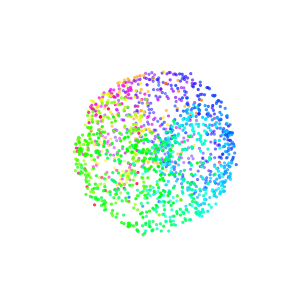

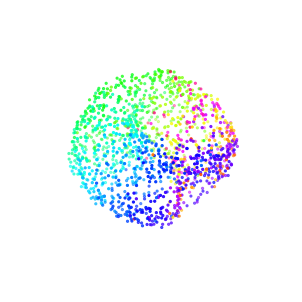

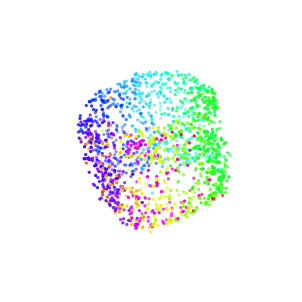

In [5]:
c1 = angs[:,0]
c2 = angs[:,1]
plt.hsv()
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,0)
plt.savefig('clif_tor_umap0_1')

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,120)
plt.savefig('clif_tor_umap120_1')

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,240)
plt.savefig('clif_tor_umap240_1')


In [10]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=800,
            k=1000,  
            nbs = 500,
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0,1,],
            compute_h2=True,
            n_points_h2=None, 
            decoding_analysis=True,
            )

data shape (4, 1500)
after Preprocessing data shape (1500, 4)
Preprocessing took 0.0029976367950439453
after Fuzzy Downsampling data shape (800, 4)
Fuzzy Downsampling took 0.7222182750701904


C:\Users\Finnern\OneDrive - NTNU\UMAPH\umaph.py:566: RuntimeWarning: divide by zero encountered in log
  d = - np.log(d)


distance_matrix (800, 800)
UMA took 0.2284388542175293
PH lifetime thresh 8.325974131742116


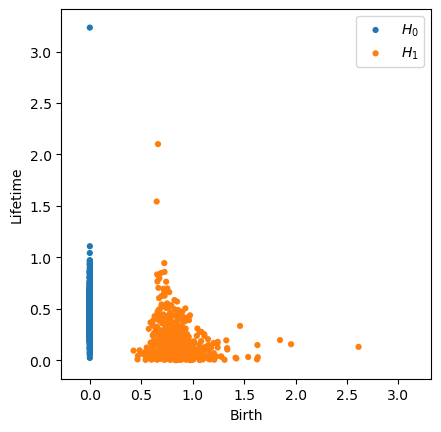

PH took 0.7358226776123047
Computing H2 with None points (takes approx 2min.)


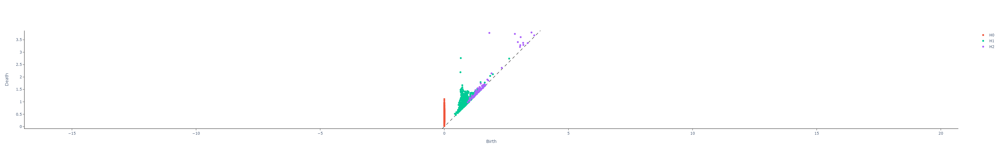

Giotto took 39.04638600349426


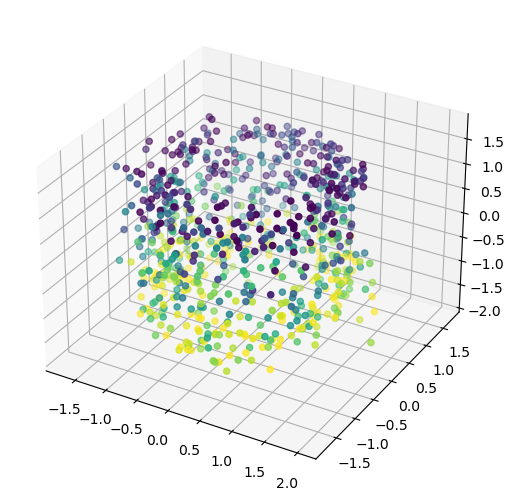

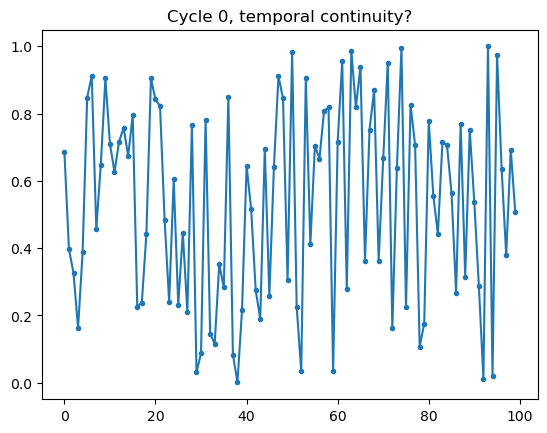

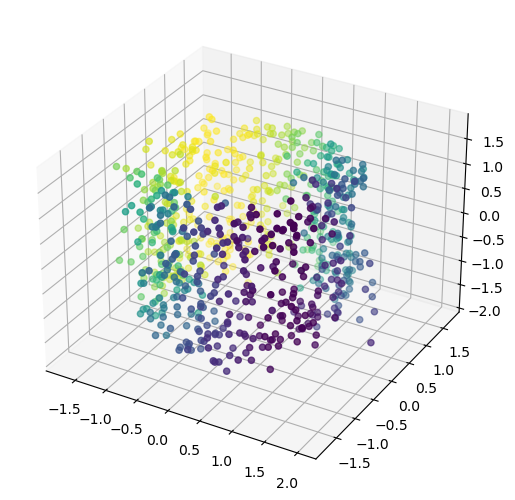

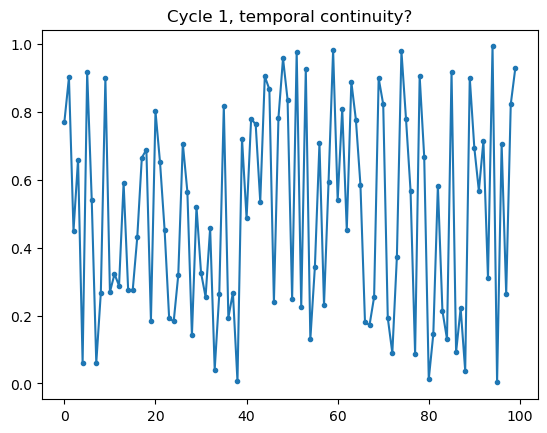

Decoding took 5.20391058921814


In [11]:
umaph_model.fit_transform(clif_tor.T)

# Hexagonal Torus

In [12]:
a_1 = 1
a_2 = 1
b_3 = 1
b_1 = 1/np.sqrt(3)
b_2 = -1/np.sqrt(3)
C_1 = 1
C_2 = 1
C_3 = 1
num_points = 10000
hex_tor = np.zeros((num_points,6))
hex_tor_true = np.zeros((num_points,6))
xx = np.zeros(num_points)
yy = np.zeros(num_points)
angs = np.zeros((num_points,2))

rot_mat = []
x,y = np.meshgrid(np.linspace(0,1, int(np.sqrt(num_points))+1)[:-1],  
                  np.linspace(0,1, int(np.sqrt(num_points))+1))
x = x.flatten()*2*np.pi
y = y.flatten()*2*np.pi

for n in range(num_points):
    u,v = x[n],y[n]
    angs[n,:] = (u,v)
    f1 = C_1 *np.cos(a_1*u + b_1*v)
    f2 = C_1 *np.sin(a_1*u + b_1*v)
    f3 = C_2 *np.cos(a_2*u + b_2*v)
    f4 = C_2 *np.sin(a_2*u + b_2*v)
    f5 = C_3 *np.cos(b_3*v)
    f6 = C_3 *np.sin(b_3*v)
    hex_tor_true[n,:] = (f1,f2,f3,f4,f5,f6)
    hex_tor[n,:] = np.random.laplace((f1,f2,f3,f4,f5,f6), scale=0.25)
    xx[n] = u
    yy[n] = v
inds = np.arange(num_points)
np.random.shuffle(inds)
npoints = 1500
inds = inds[:npoints]
hex_tor = hex_tor[inds,:]
angs = angs[inds,:]


In [13]:
data = umap_class.fit_transform(hex_tor)


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:12: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:19: MatplotlibDeprecationWarning:

Axes3D(fi

<Figure size 640x480 with 0 Axes>

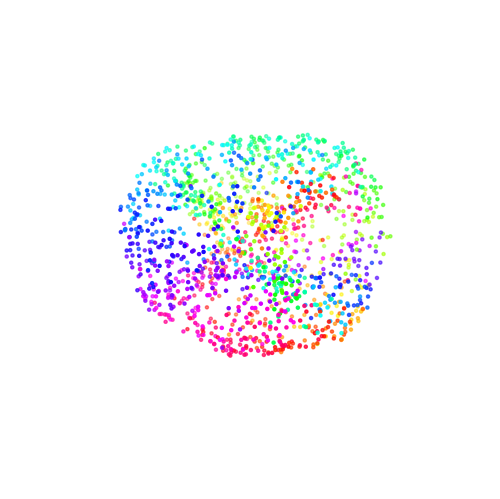

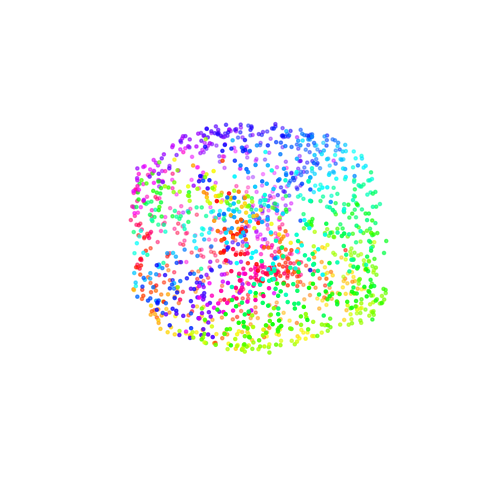

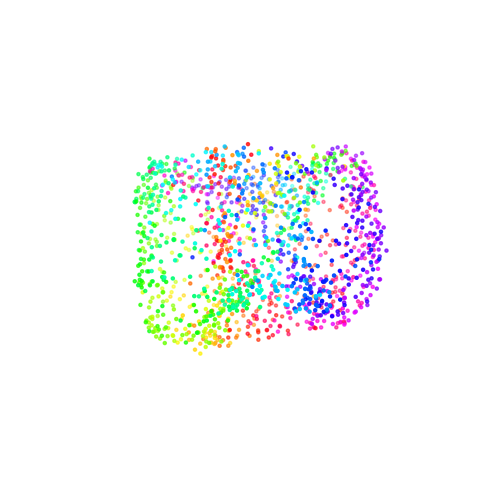

In [14]:
c1 = angs[:,0]
c2 = angs[:,1]
plt.hsv()
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,0)
plt.savefig('hex_tor_umap0_1')

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,120)
plt.savefig('hex_tor_umap120_1')

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], s = 5, c = c1)
ax.axis('off')
ax.view_init(45,240)
plt.savefig('hex_tor_umap240_1')


In [15]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=800,
            k=1000,  
            nbs = 500,
            metric='euclidean', 
            maxdim=1,  
            coeff=47,
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            dec_tresh=0.99,
            ph_classes=[0,1,],
            compute_h2=True,
            n_points_h2=None, 
            decoding_analysis=True,
            )

data shape (6, 1500)
after Preprocessing data shape (1500, 6)
Preprocessing took 0.002012491226196289
after Fuzzy Downsampling data shape (800, 6)
Fuzzy Downsampling took 0.8735060691833496


C:\Users\Finnern\OneDrive - NTNU\UMAPH\umaph.py:566: RuntimeWarning:

divide by zero encountered in log



distance_matrix (800, 800)
UMA took 0.2564425468444824
PH lifetime thresh 7.369006088086652


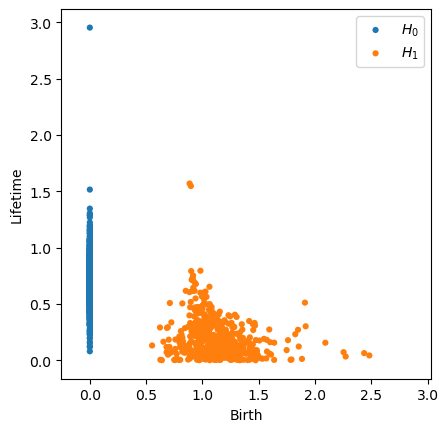

PH took 1.4588496685028076
Computing H2 with None points (takes approx 2min.)


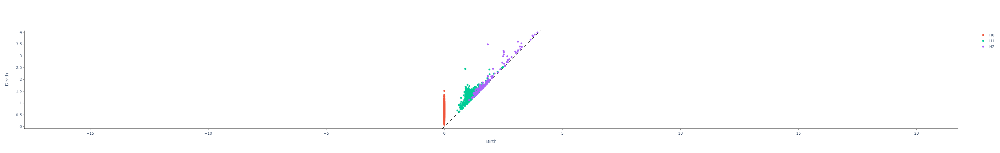

Giotto took 51.471694231033325


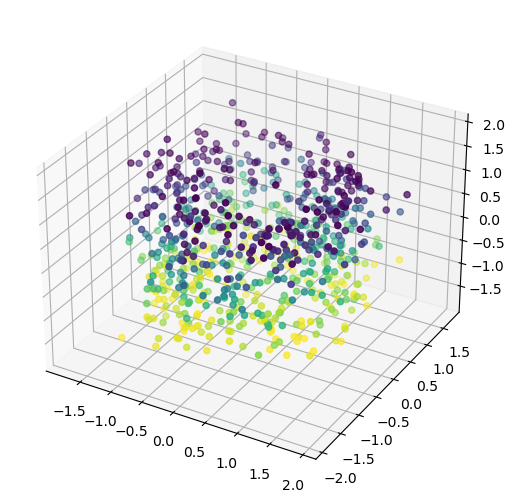

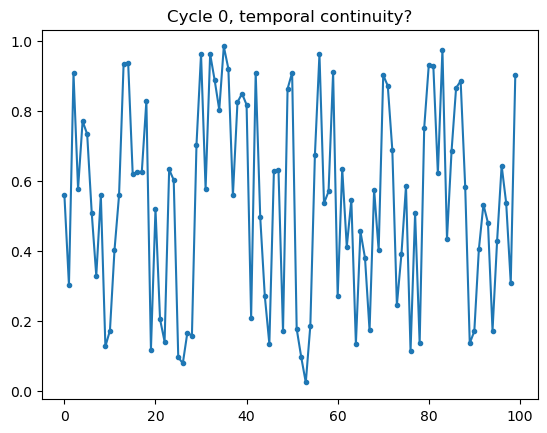

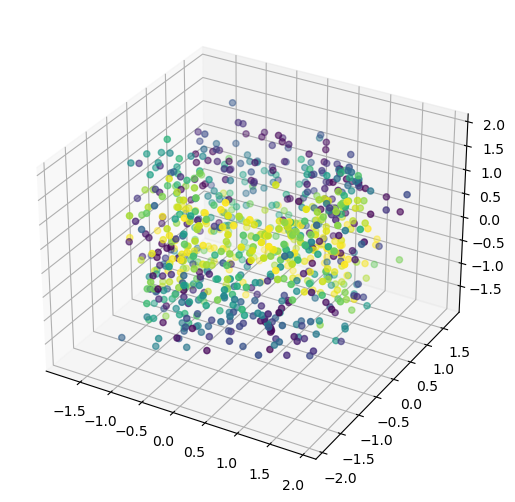

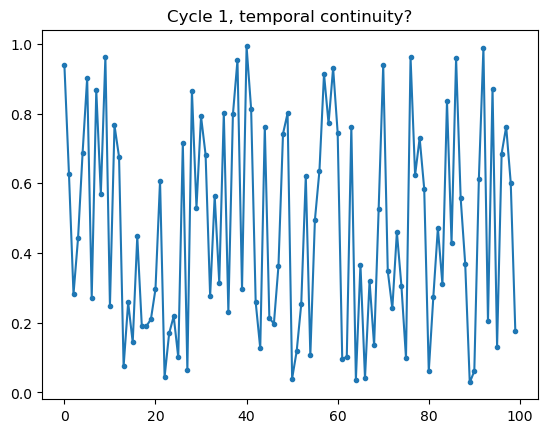

Decoding took 4.2957165241241455


In [16]:
umaph_model.fit_transform(hex_tor.T)

## 3-torus (cubic torus, 6d)

In [2]:
import numpy as np
num = 8
num_points = num*num*num
three_tor = np.zeros((num_points,6))
three_tor_true = np.zeros((num_points,6))
angs =  np.zeros((num_points,3))
xx = np.zeros(num_points)
yy = np.zeros(num_points)
zz = np.zeros(num_points)
rot_mat = []
#x,y = np.meshgrid(np.linspace(0,1, 52)[1:-1], np.linspace(0,1, 52)[1:-1])
nn = int(np.power(num_points,1/3))+1
x,y,z = np.meshgrid(np.linspace(0,1, int(np.power(num_points,1/3))+2)[:-1],  
                  np.linspace(0,1, int(np.power(num_points,1/3))+2)[:-1],
                  np.linspace(0,1, int(np.power(num_points,1/3))+2)[:-1])
x *= 2*np.pi
y *= 2*np.pi
z *= 2*np.pi
C_1, C_2, C_3 = 1,1,1
n = 0
for i in range(nn):
    for j in range(nn):
        for k in range(nn):
            u,v,w = x[i,j,k],y[i,j,k],z[i,j,k] 
            u += np.random.normal(0, scale=0.1)
            v += np.random.normal(0, scale=0.1)
            w += np.random.normal(0, scale=0.1)
#            u = u%(2*np.pi)
#            v = v%(2*np.pi)
#            w = w%(2*np.pi)
            angs[n,:] = (u,v,w)
            f1 = C_1 *np.cos(v)
            f2 = C_1 *np.sin(v)
            f3 = C_2 *np.cos(u)
            f4 = C_2 *np.sin(u)
            f5 = C_2 *np.cos(w)
            f6 = C_2 *np.sin(w)
            three_tor_true[n,:] = (f1,f2,f3,f4,f5,f6) 
#            three_tor_true[n,:] = np.random.normal((f1,f2,f3,f4,f5,f6), scale=0.1)
            n += 1
#inds = np.arange(num_points)
#np.random.shuffle(inds)
#npoints = 1000
#inds = inds[:npoints]
#three_tor = three_tor[inds,:]
#angs = angs[inds,:]



C:\Users\Finnern\AppData\Local\Temp/ipykernel_5404/2843323756.py:16: RuntimeWarning:

divide by zero encountered in log



0
3.8076173669307147
3.8076173669307147
3.8076173669307147
3.8076173669307147


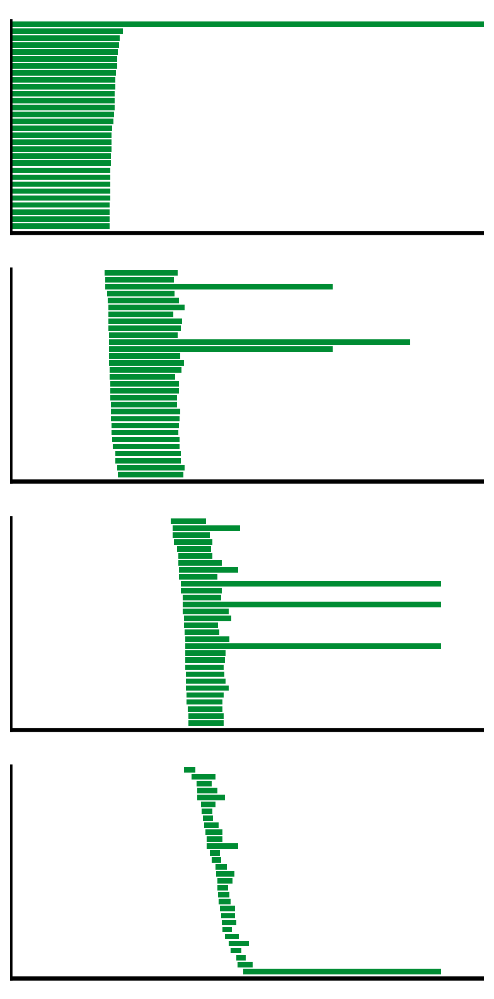

In [228]:

metric = 'euclidean'
maxdim = 3
nbs = 70
X = squareform(pdist(three_tor_true[:,:], metric))
knn_indices = np.argsort(X)[:, :nbs]
knn_dists = X[np.arange(X.shape[0])[:, None], knn_indices].copy()
sigmas, rhos = smooth_knn_dist(knn_dists, nbs, local_connectivity=0)
rows, cols, vals = compute_membership_strengths(knn_indices, knn_dists, sigmas, rhos)
result = coo_matrix((vals, (rows, cols)), shape=(X.shape[0], X.shape[0]))
result.eliminate_zeros()
transpose = result.transpose()
prod_matrix = result.multiply(transpose)
result = (result + transpose - prod_matrix)
result.eliminate_zeros()
d = result.toarray()
d = -np.log(d)
np.fill_diagonal(d,0)
thresh = np.max(d[~np.isinf(d)])
hom_dims = list(range(maxdim+1))
VR = VietorisRipsPersistence(
homology_dimensions=hom_dims,
metric='precomputed',
coeff=47,
max_edge_length= thresh,
collapse_edges=False,  # True faster?
n_jobs=None  # -1 faster?
)
diagrams = VR.fit_transform([d])
dgms = giotto_to_ripser(diagrams[0])
fig = plot_barcode(dgms)
fig.savefig('Figs/T3_barcode_umaph.png', transparent = True)
fig.savefig('Figs/T3_barcode_umaph.pdf', transparent = True)


0


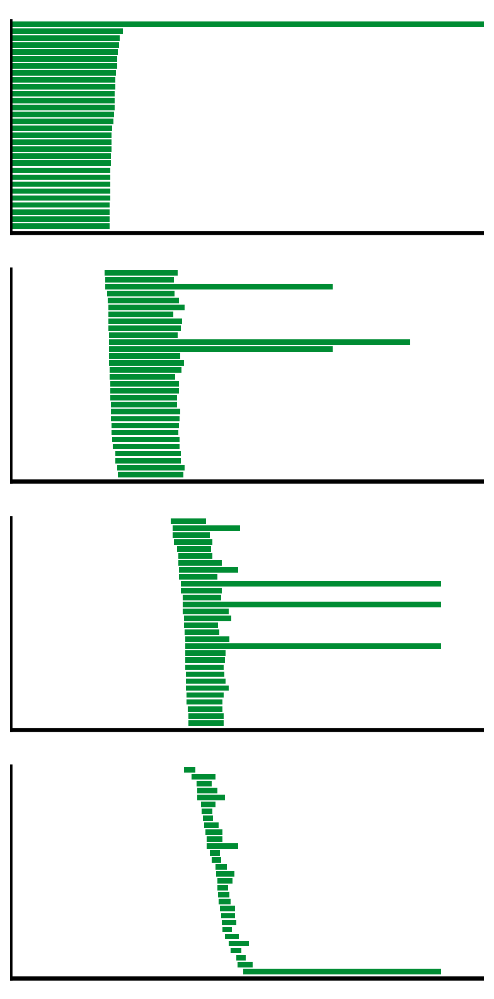

In [226]:
fig = plot_barcode(dgms)
fig.savefig('Figs/T3_barcode_umaph.png', transparent = True)
fig.savefig('Figs/T3_barcode_umaph.pdf', transparent = True)


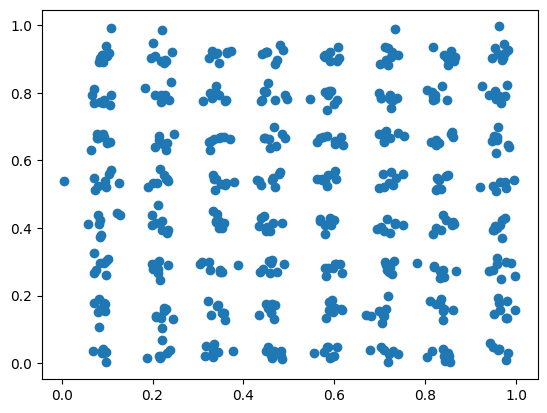

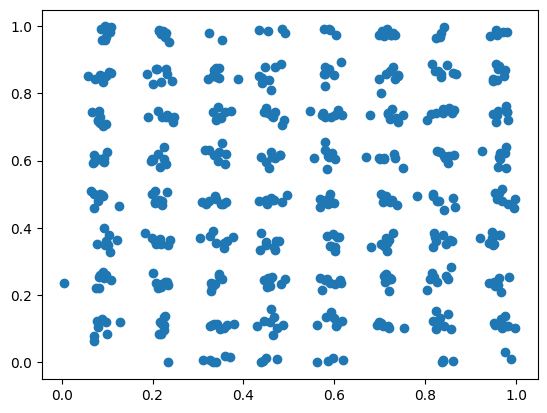

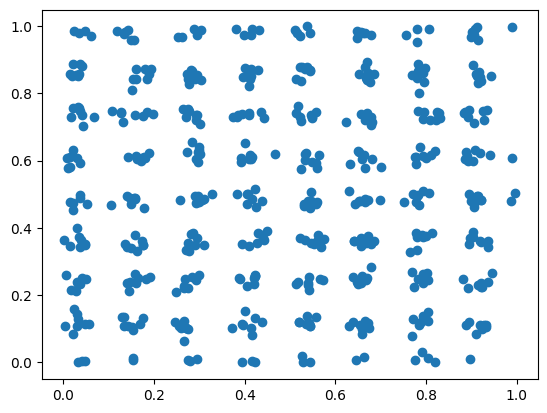

In [220]:
rips_real = ripser(d, maxdim=1, coeff=47, do_cocycles= True, distance_matrix = True, thresh = thresh)    
len_indstemp = 512
ph_classes = [0,1,2]
dec_thresh  = 0.99
coeff = 47
################### Decode coordinates ####################
num_circ = len(ph_classes)
diagrams = rips_real["dgms"] # the multiset describing the lives of the persistence classes
cocycles = rips_real["cocycles"][1] # the cocycle representatives for the 1-dim classes
dists_land = rips_real["dperm2all"] # the pairwise distance between the points 
births1 = diagrams[1][:, 0] #the time of birth for the 1-dim classes
deaths1 = diagrams[1][:, 1] #the time of death for the 1-dim classes
deaths1[np.isinf(deaths1)] = 0
lives1 = deaths1-births1 # the lifetime for the 1-dim classes
iMax = np.argsort(lives1)
coords1 = np.zeros((num_circ, len_indstemp))
c = np.max(ph_classes)
threshold = births1[iMax[-(c+1)]] + (deaths1[iMax[-(c+1)]] - births1[iMax[-(c+1)]])*dec_thresh

for j,c in enumerate(ph_classes):
    cocycle = cocycles[iMax[-(c+1)]]
    coordstemp,inds = get_coords(cocycle, threshold, len_indstemp, dists_land, coeff)
    coords1[j,:] = coordstemp

plt.figure()
plt.scatter(coords1[0,:], coords1[1,:])
plt.figure()
plt.scatter(coords1[0,:], coords1[2,:])
plt.figure()
plt.scatter(coords1[1,:], coords1[2,:])


C:\Users\Finnern\AppData\Local\Temp/ipykernel_5404/982362948.py:7: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



<Figure size 640x480 with 0 Axes>

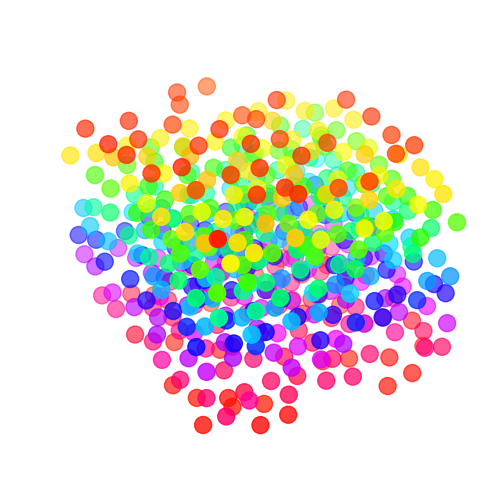

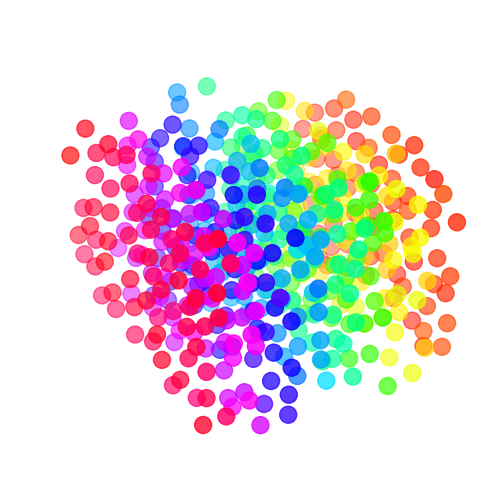

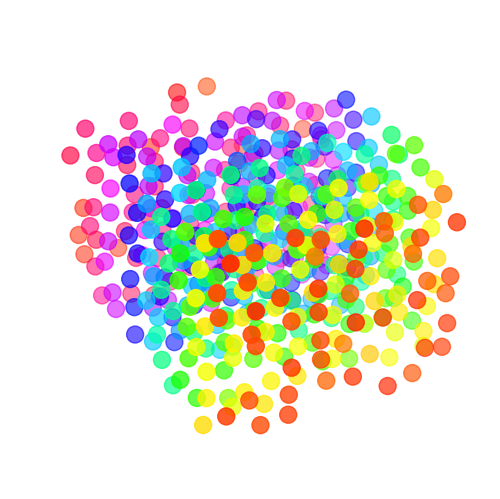

In [221]:
coords1 = (coords1-coords1[:,0:1])%(1)

#for nn, c in enumerate([umaph_model.decoded[:,0], umaph_model.decoded[:,1], umaph_model.decoded[:,2]]):
for nn, c in enumerate([angs[:,0], angs[:,1], angs[:,2]]):
    plt.hsv()
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(*coords1*2*np.pi, s = 150, c = c)
    ax.axis('off')
    ax.view_init(30,60)
    ax.set_xlim(0,2*np.pi)
    ax.set_ylim(0,2*np.pi)
    ax.set_zlim(0,2*np.pi)
    plt.savefig('Figs/T3_dec' + str(nn) + '.png', transparent = True)
    plt.savefig('Figs/T3_dec' + str(nn) + '.pdf', transparent = True)

C:\Users\Finnern\AppData\Local\Temp/ipykernel_5404/1189042060.py:4: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



<Figure size 640x480 with 0 Axes>

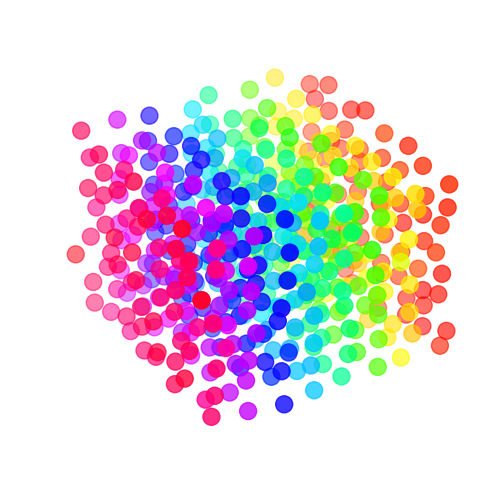

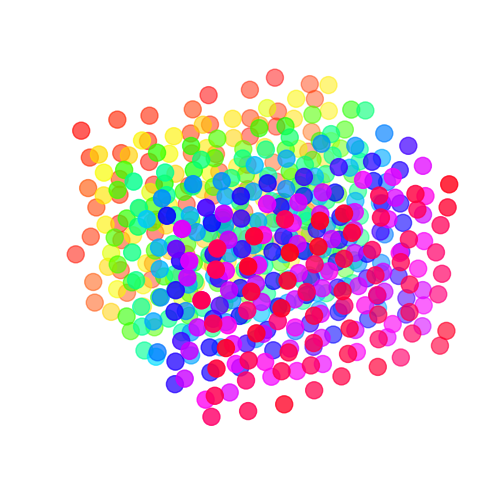

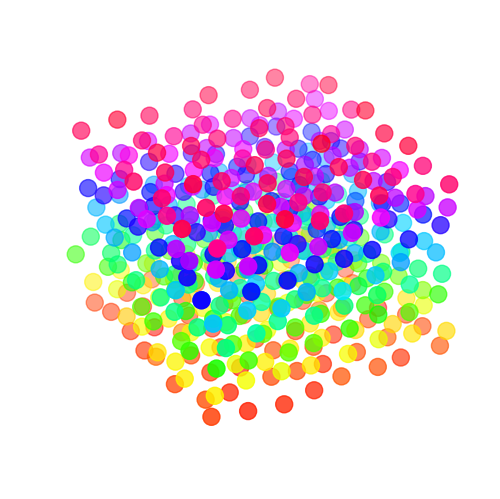

In [210]:
for nn, c in enumerate([angs[:,0], angs[:,1], angs[:,2]]):
    plt.hsv()
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(*angs.T, s = 150, c = c)
    ax.axis('off')
    ax.view_init(30,60)
    ax.set_xlim(0,2*np.pi)
    ax.set_ylim(0,2*np.pi)
    ax.set_zlim(0,2*np.pi)
#    ax.set_aspect('equal', 'box')
    plt.savefig('Figs/T3' + str(nn) + '.png', transparent = True)
    plt.savefig('Figs/T3' + str(nn) + '.pdf', transparent = True)

In [222]:
import umap as UMAP
umap_class = UMAP.umap_.UMAP(n_neighbors=70, n_components=3)#, min_dist= 1)


In [223]:
data = umap_class.fit_transform(three_tor_true)


C:\Users\Finnern\AppData\Local\Temp/ipykernel_5404/2181571385.py:5: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



<Figure size 640x480 with 0 Axes>

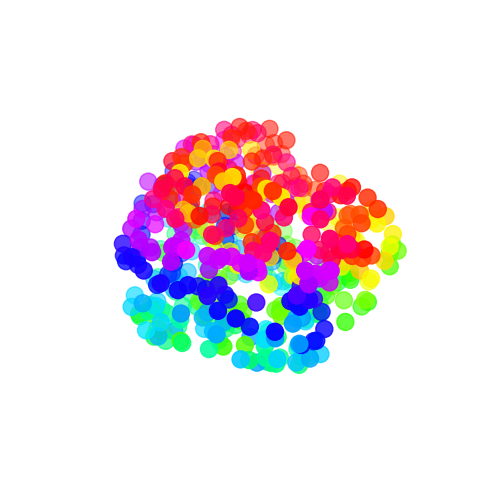

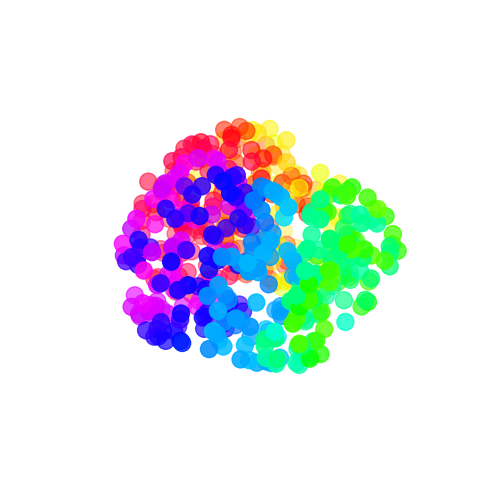

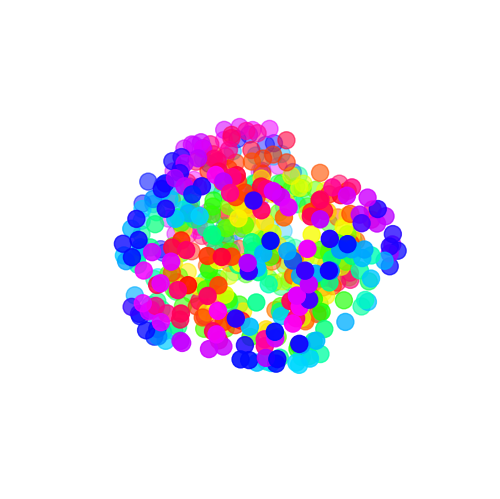

In [224]:
for nn, c in enumerate([angs[:,0], angs[:,1], angs[:,2]]):
#for nn, c in enumerate([data[:,0], data[:,1], data[:,2]]):
    plt.hsv()
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(data[:,0], data[:,1], data[:,2], s = 150, c = c)
    ax.axis('off')
    ax.view_init(220,10)
    plt.savefig('Figs/T3_UMAP_' + str(nn) + '.png', transparent = True)
    plt.savefig('Figs/T3_UMAP_' + str(nn) + '.pdf', transparent = True)


(-1.1063992543860104,
 6.617505654876311,
 -0.637062947277422,
 6.9311131512241735)

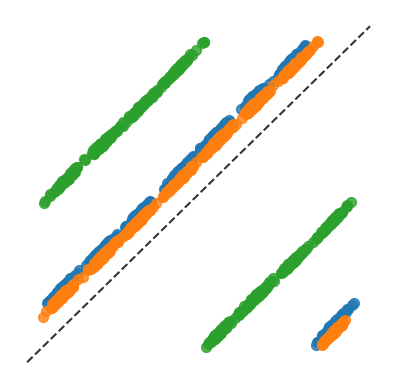

In [242]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(angs[:,0], umaph_model.decoded[:,1], alpha = 0.8, s = 50)
ax.scatter(angs[:,1], 2*np.pi-umaph_model.decoded[:,2], alpha = 0.8, s = 50)
ax.scatter(angs[:,2], umaph_model.decoded[:,0], alpha = 0.8, s = 50)
xmin,xmax = ax.get_xlim()
ymin,ymax = ax.get_ylim()
plt.plot([xmin,xmax], [ymin,ymax], c = 'k', ls = '--', alpha = 0.8, zorder = -1)
ax.set_aspect('equal', 'box')
ax.axis('off')
#plt.savefig('Figs/Final/T3_dec')
#plt.scatter(angs[:,0])

## Trefoil knot

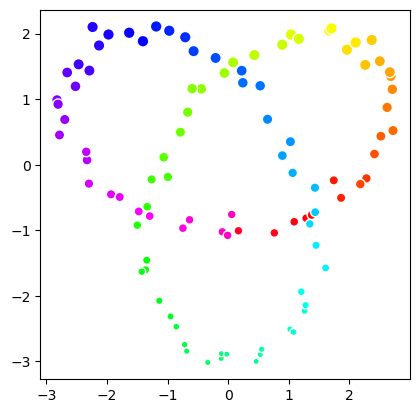

In [319]:
from numpy import linspace,pi,cos,sin


phi = linspace(0,2*pi,100)+ np.random.randn(100)*0.01#+ np.random.normal(1000, scale=1)
x = sin(phi)+2*sin(2*phi)
y = cos(phi)-2*cos(2*phi)
z = -3*sin(3*phi)


data = np.concatenate((x[:, np.newaxis], 
                       y[:, np.newaxis], 
                       z[:, np.newaxis]),1)

data += np.random.normal(np.zeros((len(data),3)), scale=0.1)

s=abs(((y+3)+2)*10)
fig = plt.figure()
ax = fig.add_subplot(111)
indssort = np.argsort(phi)
ax.scatter(data[indssort,0],data[indssort,1],
           c=phi[indssort]%(2*np.pi),s=s,edgecolor='w',cmap=cm.gist_rainbow)
ax.set_aspect(1/ax.get_data_ratio())
show()

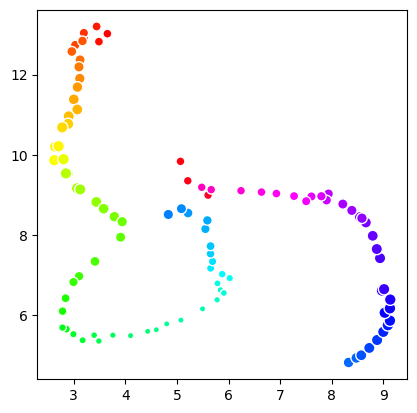

In [320]:
import umap as UMAP
umap_class = UMAP.umap_.UMAP(n_neighbors=10, n_components=2)#, min_dist= 1)
umap_proj = umap_class.fit_transform(data)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(umap_proj[:,0],umap_proj[:,1],c=phi,s=s,edgecolor='w',cmap=cm.gist_rainbow)
ax.set_aspect(1/ax.get_data_ratio())
show()

##### regular ph

In [331]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=100,
            nbs = 15,
            metric='euclidean', 
            maxdim=1,  
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            ph_classes=[0,],
            decoding_analysis=True,
            bUMA = False
            )

data shape (3, 100)
after Preprocessing data shape (100, 3)
Preprocessing took 0.008302450180053711
PH lifetime thresh 4.262281049623953


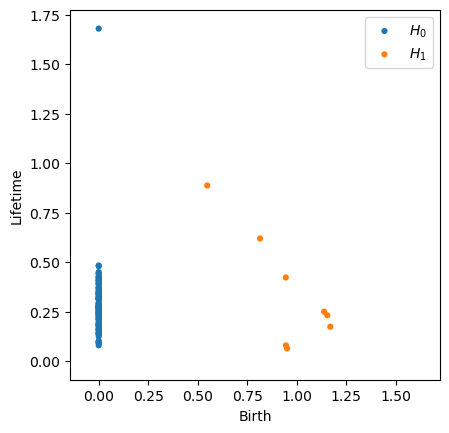

PH took 0.18416094779968262


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:667: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) 

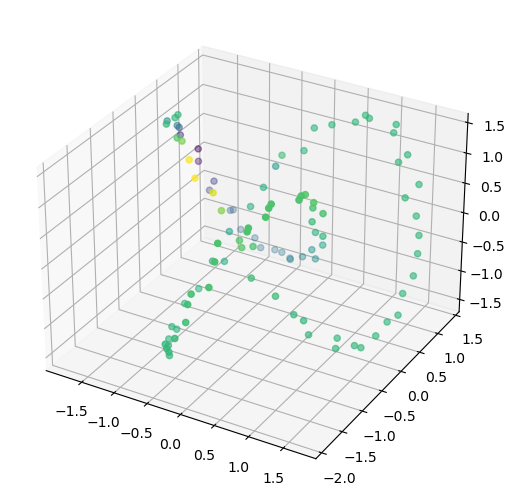

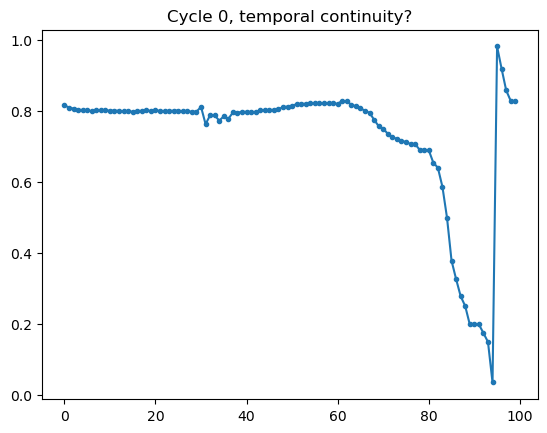

In [332]:
umaph_model.fit_transform(data.T)

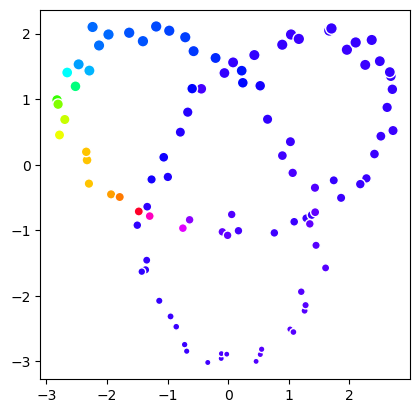

In [333]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(data[:,0],data[:,1],c=umaph_model.decoded[:,0],s=s,edgecolor='w',cmap=cm.gist_rainbow)
ax.set_aspect(1/ax.get_data_ratio())
show()

In [338]:
umaph_model =  UMAPH(
            pca_dim=0,  
            n_points=100,
            nbs = 15,
            metric='euclidean', 
            maxdim=1,  
            active_times=0,
            smoothing=0,
            bSqrt = False,
            num_times=1,
            ph_classes=[0,],
            decoding_analysis=True,
            )

data shape (3, 100)
after Preprocessing data shape (100, 3)
Preprocessing took 0.0020079612731933594
distance_matrix (100, 100)
UMA took 0.007002115249633789
PH lifetime thresh 3.4135018237368597


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:579: RuntimeWarning:

divide by zero encountered in log



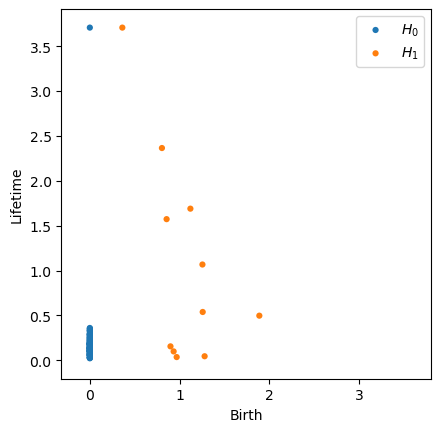

PH took 0.2155458927154541
Threshold is infinite, using birth*1.5 as threshold


C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:344: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:345: DeprecationWarning:

setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.

C:\Users\Finnern\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:667: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) 

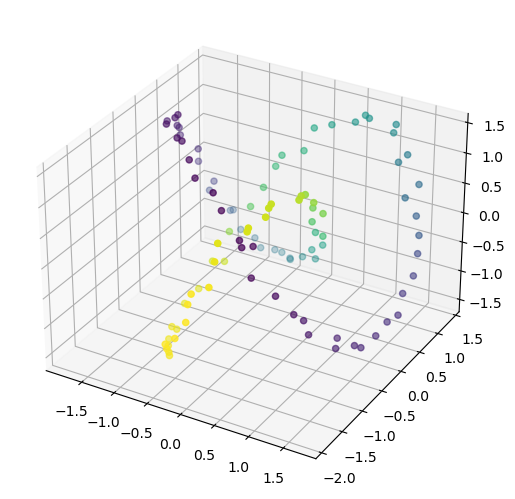

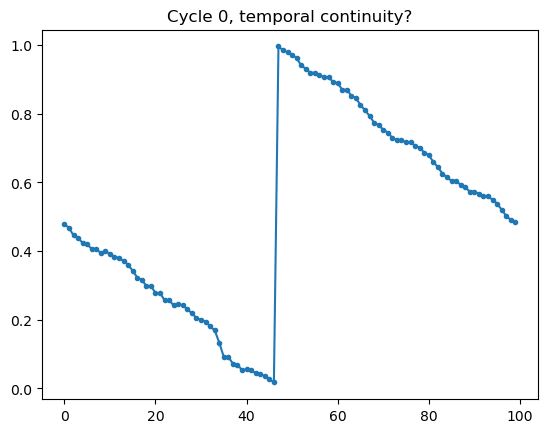

In [339]:
umaph_model.fit_transform(data.T)

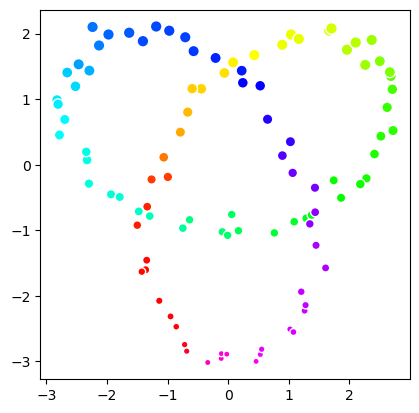

In [340]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(data[:,0],data[:,1],c=umaph_model.decoded[:,0],s=s,edgecolor='w',cmap=cm.gist_rainbow)
ax.set_aspect(1/ax.get_data_ratio())
show()